In [5]:
# data manipulation
import numpy as np
import pandas as pd

#file processing / requests
from pathlib import Path
from tqdm import tqdm
import json
import urllib

#computer vision
import cv2
import torch
import torchvision

import PIL

#ML
from sklearn.model_selection import train_test_split


#display
from IPython.display import display
from pylab import rcParams

#visualization
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
import PIL.Image as Image

#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
pd.set_option('display.max_columns', None)

pd.set_option('display.float_format', lambda x: '%.2f' % x)

### Notebook Purpose: Perform unsupervised clustering on dataset of credit card transaction behaviors of ~9000 customers taken from following Kaggle competition https://www.kaggle.com/arjunbhasin2013/ccdata/version/1

Notebook authors: Philippe Heitzmann

In [2]:
!pip install spacy nltk gensim textblob bokeh imutils pytesseract plotly hdbscan statsmodels

     |████████████████████████████████| 24.1 MB 14.7 MB/s eta 0:00:01
     |████████████████████████████████| 636 kB 10.1 MB/s eta 0:00:01
     |████████████████████████████████| 18.5 MB 11.2 MB/s eta 0:00:01
     |████████████████████████████████| 27.7 MB 8.4 MB/s eta 0:00:012
     |████████████████████████████████| 5.2 MB 10.9 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 9.9 MB 11.1 MB/s eta 0:00:01
     |████████████████████████████████| 40 kB 10.8 MB/s eta 0:00:01
     |████████████████████████████████| 233 kB 19.2 MB/s eta 0:00:01
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25860 sha256=7626accabfabf29450d53e7b0ef9eb80ce75a080a496ed5d6a58940b0567a10f
  Stored in directory: /root/.cache/pip/wheels/59/1b/52/0dea905f8278d5514dc4d0be5e251967f8681670cadd3dca89
  Created wheel for hdbscan: filename=hdbscan-0.8.28-cp38-cp3

In [5]:
#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

In [6]:
df = readcsv('CC GENERAL.csv')
df.head()

0.0 sec to complete <function readcsv at 0x7faaabf59700>


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.90,0.82,95.40,0.00,95.40,0.00,0.17,0.00,0.08,0.00,0,2,1000.00,201.80,139.51,0.00,12
1,C10002,3202.47,0.91,0.00,0.00,0.00,6442.95,0.00,0.00,0.00,0.25,4,0,7000.00,4103.03,1072.34,0.22,12
2,C10003,2495.15,1.00,773.17,773.17,0.00,0.00,1.00,1.00,0.00,0.00,0,12,7500.00,622.07,627.28,0.00,12
3,C10004,1666.67,0.64,1499.00,1499.00,0.00,205.79,0.08,0.08,0.00,0.08,1,1,7500.00,0.00,NaN,0.00,12
4,C10005,817.71,1.00,16.00,16.00,0.00,0.00,0.08,0.08,0.00,0.00,0,1,1200.00,678.33,244.79,0.00,12


In [483]:
df2 = readcsv('CC GENERAL.csv')
df2.loc[~(df2['MINIMUM_PAYMENTS'].isna()) & (df2['PRC_FULL_PAYMENT'] == 0)].shape[0]

0.1 sec to complete <function readcsv at 0x7fabd74075e0>


5590

In [7]:
#The sample Dataset summarizes the usage behavior of about 9000 active credit card holders during the last 6 months. The file is at a customer level with 18 behavioral variables.
show1(df)
print(df['CUST_ID'].nunique())

(8950, 18) <class 'pandas.core.frame.DataFrame'>
8950


#### Given this is an unsupervised ML problem, what question do we really want to answer?

1. General segmentation: How can we best describe and segment our credit card customer base by their demographic and financial profile in order to better tailor our marketing messaging to these different groups? 

1. Segmentation by frequency of transactions and total number of transactions: how can we segment our customers by frequency of transactions and total number of transactions of different types to deliver differentiated marketing treatments to each?

1. Segmentation by transaction amounts: how can we segment our customers by amounts of transactions of different types to deliver differentiated marketing treatments to each?

###### Amounts of Purchases done by user
- ONEOFF_PURCHASES
- INSTALLMENTS_PURCHASES
- PURCHASES
- CASH_ADVANCE
- PAYMENTS
- MINIMUM_PAYMENTS
- CREDIT_LIMIT
- BALANCE

### Counts / Frequencies of Transactions
- PURCHASES_FREQUENCY
- PURCHASES_TRX CASH_ADVANCE_TRX
- PURCHASES_INSTALLMENTS_FREQUENCY 
- ONEOFF_PURCHASES_FREQUENCY
- CASH_ADVANCE_FREQUENCY
- CASH_ADVANCE_TRX
- PRC_FULL_PAYMENT
- BALANCE_FREQUENCY

### Demographic
- TENURE

### Misc
- CUSTID

#### Potential supervised ML question: how can we predict CREDIT_LIMIT from other variables?

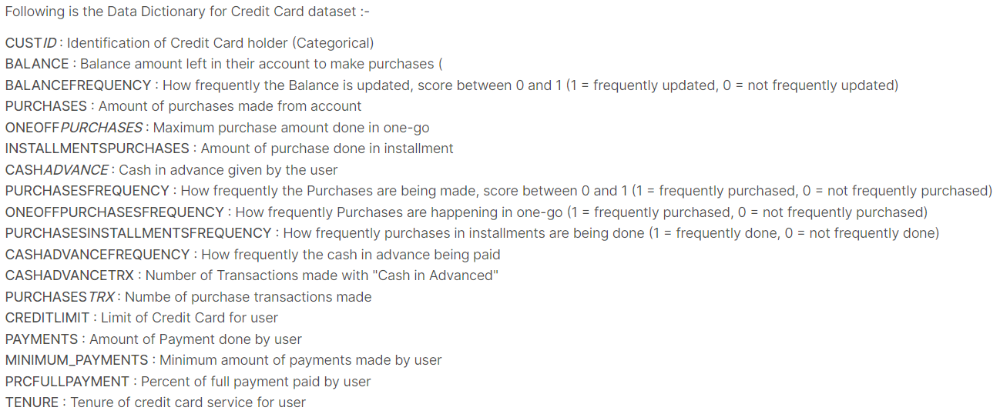

In [11]:
#data dictionary
from IPython.display import Image
Image(filename='Credit_Card_DD.png') 

### Data Preprocessing

#### Step 1: Data cleaning and missing value imputation

In [7]:
#checking nulls
df.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [22]:
#looking at differences in customers with MINIMUM_PAYMENTS missing values versus customers without 
df.loc[df['MINIMUM_PAYMENTS'].isnull()].describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,0.0,313.0,313.000000
mean,555.441321,0.389403,393.087284,250.433387,142.653898,559.136698,0.336043,0.107886,0.244670,0.067169,1.460064,5.833866,3731.789137,322.286168,NaN,0.0,11.063898
std,1292.687887,0.408341,757.905701,624.453991,311.289043,1185.132567,0.372517,0.227370,0.359756,0.130087,3.182359,9.600908,2924.606153,1996.658905,NaN,0.0,1.869734
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,500.000000,0.000000,NaN,0.0,6.000000
25%,0.187069,0.090909,1.400000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1500.000000,0.000000,NaN,0.0,12.000000
50%,16.848358,0.181818,130.400000,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,2.000000,3000.000000,0.000000,NaN,0.0,12.000000
75%,286.686616,1.000000,399.950000,176.030000,152.280000,480.104401,0.583333,0.083333,0.416667,0.083333,1.000000,8.000000,5000.000000,0.000000,NaN,0.0,12.000000
max,9164.724752,1.000000,7597.090000,6761.290000,2959.240000,7616.064965,1.000000,1.000000,1.000000,1.000000,21.000000,77.000000,19500.000000,29272.486070,NaN,0.0,12.000000


In [23]:
df.loc[~df['MINIMUM_PAYMENTS'].isnull()].describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8637.000000,8637.000000,8637.000000,8637.000000,8637.000000,8637.000000,8637.000000,8637.000000,8637.000000,8637.000000,8637.000000,8637.000000,8636.000000,8637.000000,8637.000000,8637.000000,8637.00000
mean,1601.041632,0.894951,1025.315149,604.831402,420.794807,994.082050,0.495943,0.205885,0.368778,0.137608,3.313651,15.031492,4522.091030,1784.272537,864.206542,0.159285,11.53375
std,2095.519182,0.207833,2167.010602,1684.222861,917.203254,2121.353259,0.401285,0.300044,0.398090,0.201780,6.912151,25.179530,3659.240379,2909.704331,2372.446607,0.296259,1.31226
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.00000
25%,147.838347,0.909091,43.300000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.446951,169.123707,0.000000,12.00000
50%,916.749476,1.000000,375.240000,44.990000,94.710000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.300688,312.343947,0.000000,12.00000
75%,2104.961701,1.000000,1145.850000,598.950000,484.040000,1131.986387,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.116757,825.485459,0.166667,12.00000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.00000


In [26]:
df.shape[0] - df.loc[df['MINIMUM_PAYMENTS'] > 0].shape[0]

313

#### How do we impute MINIMUM_PAYMENTS?
Looking at mean differences in independent variables other than MINIMUM_PAYMENTS to devise optimal imputation strategy for the latter, it appears 
customers with missing MINIMUM_PAYMENTS values are on the whole lower-spend and lower card activity customers with for instance:

- lower total payment amounts (PURCHASES  variable)
- lower total payments (PAYMENTS variable)
- lower card balances (BALANCE variable) 
- lower frequency of updates to balances (BALANCE_FREQUENCY)
- lower amounts in other types of purchases (ONEOFF_PURCHASES, INSTALLMENTS_PURCHASES)
- On the other hand, these customers appear to follow a similar distribution in tenure (11.5 vs 11.8 averages with ~1.5 standard deviations). 

Furthermore considering that PRC_FULL_PAYMENT is zero for all these non-missing value customers and that the number 
of missing values is equal to the difference in our count of observations minus the number of non-missing values that are greater than zero, it should therefore be expected
that these missing MINIMUM_PAYMENTS values actually point to zero, which is how we will impute these values in the next line:

In [104]:
#imputing missing MINIMUM_PAYMENTS values to zero
df['MINIMUM_PAYMENTS'] = df['MINIMUM_PAYMENTS'].fillna(0)

In [137]:
df.loc[df['CREDIT_LIMIT'].isna()]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,C15349,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [138]:
df.groupby('TENURE')['CREDIT_LIMIT'].mean()

TENURE
6     3002.561576
7     2567.631579
8     2973.724490
9     2977.904762
10    3871.610169
11    4141.232877
12    4693.331329
Name: CREDIT_LIMIT, dtype: float64

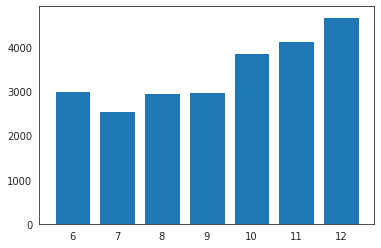

In [11]:
dfg2 = df.groupby('TENURE')['CREDIT_LIMIT'].mean().reset_index()
plt.bar(x = dfg2['TENURE'], height = dfg2['CREDIT_LIMIT'])
plt.show()

Initiated with figsize (10, 6)


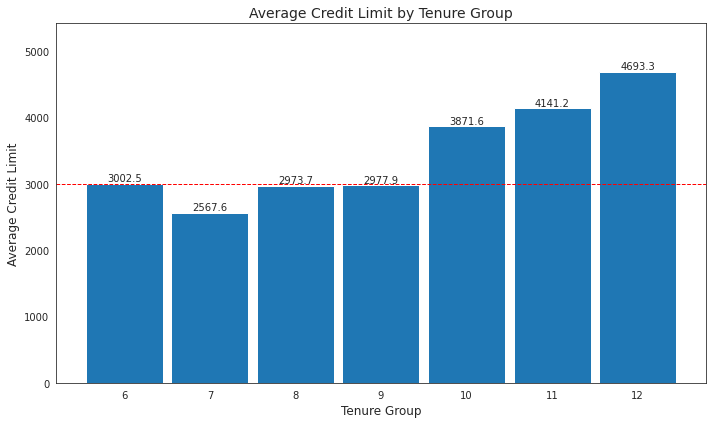

In [23]:
#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

viz5 = Viz(df = dfg2)
viz5.make_barplot(x = 'TENURE', height = 'CREDIT_LIMIT', df = None, barwidth = 0.9, ylim_scalefactor = 1.1, barh = False, # hlines = [dfg2['CREDIT_LIMIT'].mean()],
                  label_adj = 1, annots = True, title = ('Average Credit Limit by Tenure Group',14), xlabel = ('Tenure Group', 12), ylabel = ('Average Credit Limit', 12))
plt.axhline(y = 3000, linestyle = '--', color = 'red', linewidth = 1)
# plt.text(0.05, hline + 0.025, str(hline), transform = trans, fontsize = 10, color = 'black')

In [105]:
#Given it appears credit limit varies quite a bit with tenure with <10 years tenure customers posting credit limits <$3K on the whole vs ~$4K for >10y, and given our own 
#industry knowledge regarding the impact of tenure on offered credit limits, we will choose to impute this missing credit limit value to the mean 

#imputing missing CREDIT_Limit value to mea of $3,000 for <10y tenure customers
df['CREDIT_LIMIT'] = df['CREDIT_LIMIT'].fillna(3000)

#### Step 2: Outlier Treatment

In [65]:
#getting list of indices of all potential outlier values for each of our df columns
outlier_idx_dict = get_outliers(df)
outlier_idx_dict['BALANCE'][:5]

0.0 sec to complete <function get_outliers at 0x7faaab9d54c0>


[15, 21, 24, 28, 30]

In [101]:
#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

Outlier low and high thresholds: -1566.1075000000003 2715.8725000000004
PURCHASES min and max values: 0.0 49039.57
Number of detected potential outliers: 808 or 9.0 % of dataset values
Number of values greater than 30000:  7
Initiated with figsize (7, 4)


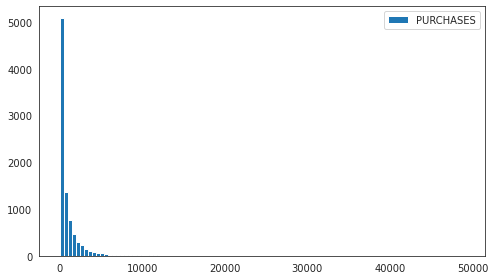

In [102]:
get_col_stats('PURCHASES', df = df, maxval = 30000)

#considering PURCHASES represents amount of purchases made from account in last 6 months, as it should theoretically be possible to have $50K in credit card purchases 
#in a six month period, we will elect not to treat these PURCHASES outlier values for now  

Outlier low and high thresholds: -866.1075 1443.5124999999998
ONEOFF_PURCHASES min and max values: 0.0 40761.25
Number of detected potential outliers: 1013 or 11.3 % of dataset values
Number of values greater than 10000:  39
Initiated with figsize (7, 4)


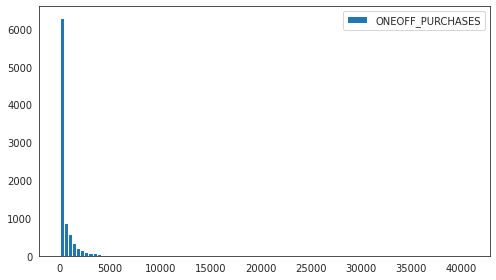

In [103]:
#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

get_col_stats('ONEOFF_PURCHASES', df = df, maxval = 10000)

#considering ONEOFF_PURCHASES represents Maximum purchase amount done in one-go in last 6 months, as it should theoretically be possible to have $10-$40K in total oneoff credit card
#purchases in a six month period, we will elect not to treat these ONEOFF_PURCHASES outlier values for now  

Outlier low and high thresholds: -702.95625 1171.59375
INSTALLMENTS_PURCHASES min and max values: 0.0 22500.0
Number of detected potential outliers: 867 or 9.7 % of dataset values
Number of values greater than 10000:  12
Initiated with figsize (7, 4)


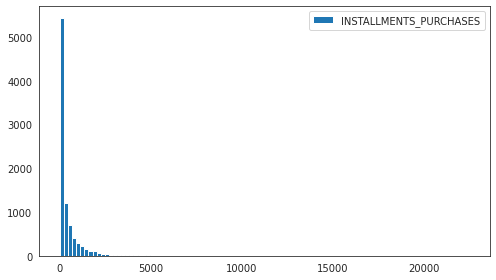

In [104]:
#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

get_col_stats('INSTALLMENTS_PURCHASES', df = df)
#considering INSTALLMENTS_PURCHASES represents Amount of purchase done in installment in last 6 months, as it should theoretically be possible to have $10-$25K in total 
#installment purchases in a six month period, we will elect not to treat these INSTALLMENTS_PURCHASES outlier values for now  

Outlier low and high thresholds: -1670.7317088750003 2784.5528481250003
CASH_ADVANCE min and max values: 0.0 47137.21176
Number of detected potential outliers: 1030 or 11.5 % of dataset values
Number of values greater than 10000:  77
Initiated with figsize (7, 4)


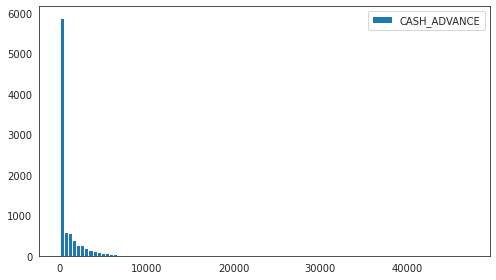

In [105]:
get_col_stats('CASH_ADVANCE', df = df)

In [106]:
#seems high but possible - keep in dataset for now
df.loc[df['CASH_ADVANCE'] > 46000]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
2159,C12226,10905.05381,1.0,431.93,133.5,298.43,47137.21176,0.583333,0.25,0.5,1.0,123,21,19600.0,39048.59762,5394.173671,0.0,12


Outlier low and high thresholds: -0.333333 0.555555
CASH_ADVANCE_FREQUENCY min and max values: 0.0 1.5
Number of detected potential outliers: 525 or 5.9 % of dataset values
Number of values greater than 10000:  0
Initiated with figsize (7, 4)


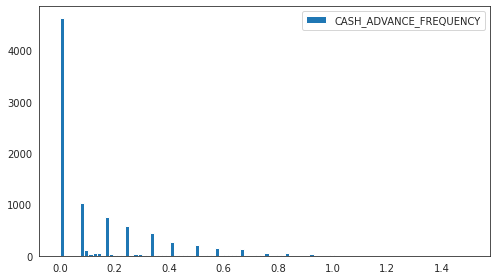

In [109]:
get_col_stats('CASH_ADVANCE_FREQUENCY', df = df)

In [114]:
#these values should not be possible given CASH_ADVANCE_FREQUENCY should vary between 0 and 1. We will therefore winsorize these to 0 
df.loc[df['CASH_ADVANCE_FREQUENCY'] > 1]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
681,C10708,5656.069801,1.000000,362.36,362.36,0.0,7240.433194,0.250000,0.250000,0.0,1.250000,12,2,8000.0,683.421497,2036.877611,0.0,8
1626,C11680,2876.009336,1.000000,152.61,152.61,0.0,3719.650168,0.333333,0.333333,0.0,1.166667,24,2,4000.0,248.342971,584.926336,0.0,6
2555,C12629,5906.184924,1.000000,141.80,141.80,0.0,1651.286918,0.125000,0.125000,0.0,1.125000,12,2,10000.0,933.969974,919.289675,0.0,8
2608,C12684,7801.511533,1.000000,231.40,231.40,0.0,4109.465221,0.100000,0.100000,0.0,1.100000,20,3,13500.0,1593.617739,1522.496755,0.0,10
3038,C13127,3846.742530,1.000000,0.00,0.00,0.0,1932.460679,0.000000,0.000000,0.0,1.500000,18,0,5600.0,496.245836,538.346874,0.0,6
3253,C13347,5709.486507,0.833333,0.00,0.00,0.0,2794.326341,0.000000,0.000000,0.0,1.166667,10,0,6000.0,550.513331,1299.463370,0.0,6
8055,C18273,1917.895730,1.000000,285.07,285.07,0.0,6084.858872,0.363636,0.363636,0.0,1.090909,28,6,3000.0,5692.682993,556.449635,0.0,11
8365,C18588,3857.562230,1.000000,0.00,0.00,0.0,2127.213754,0.000000,0.000000,0.0,1.142857,26,0,5000.0,617.508991,538.396872,0.0,7


In [116]:
idxs = df.loc[df['CASH_ADVANCE_FREQUENCY'] > 1].index
for idx in idxs:
    df.iloc[idx, 10] = 1
df.loc[df['CASH_ADVANCE_FREQUENCY'] > 1]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE


Outlier low and high thresholds: -6.0 10.0
CASH_ADVANCE_TRX min and max values: 0.0 123.0
Number of detected potential outliers: 804 or 9.0 % of dataset values
Number of values greater than 100:  5
Initiated with figsize (7, 4)


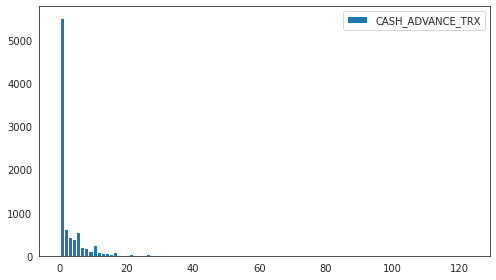

In [118]:
get_col_stats('CASH_ADVANCE_TRX', df = df, maxval = 100)

In [119]:
df.loc[df['CASH_ADVANCE_TRX'] > 100]
#as a max of 123 cash advances transactions in a xis month possible would be theoretically possible at a rate of one such txn every 1.5 days on average, will
#elect not to treat these for now

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
542,C10566,1284.633140,1.000000,55.50,0.0,55.50,5406.459348,0.083333,0.000000,0.083333,0.833333,123,1,3000.0,3432.757202,421.385587,0.000000,12
1913,C11975,1856.325339,0.818182,670.50,516.9,153.60,5603.126858,0.545455,0.272727,0.363636,0.727273,107,9,7000.0,9221.922948,537.180986,0.142857,11
2159,C12226,10905.053810,1.000000,431.93,133.5,298.43,47137.211760,0.583333,0.250000,0.500000,1.000000,123,21,19600.0,39048.597620,5394.173671,0.000000,12
3545,C13645,4175.826879,1.000000,0.00,0.0,0.00,9968.184827,0.000000,0.000000,0.000000,0.909091,110,0,10500.0,1083.433387,1000.206323,0.000000,11
8315,C18536,2648.244646,1.000000,0.00,0.0,0.00,10458.978150,0.000000,0.000000,0.000000,1.000000,123,0,4000.0,9818.531412,665.888853,0.000000,12


Outlier low and high thresholds: -23.0 41.0
PURCHASES_TRX min and max values: 0.0 358.0
Number of detected potential outliers: 766 or 8.6 % of dataset values
Number of values greater than 300:  5
Initiated with figsize (7, 4)


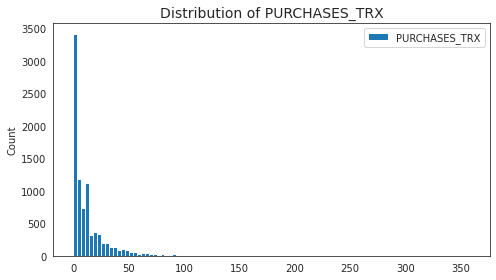

In [75]:
#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

get_col_stats('PURCHASES_TRX', df = df, maxval = 300, outlier_idx_dict = outlier_idx_dict, title = ('Distribution of PURCHASES_TRX',14), ylabel = ('Count',10))

Outlier low and high thresholds: -5750.0 13850.0
CREDIT_LIMIT min and max values: 50.0 30000.0
Number of detected potential outliers: 248 or 2.8 % of dataset values
Number of values greater than 25000:  3
Initiated with figsize (7, 4)


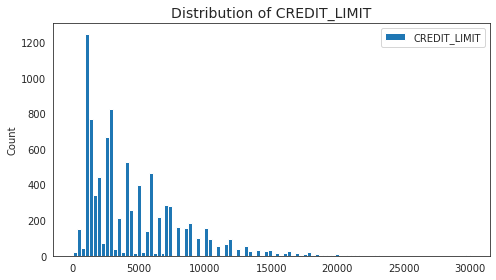

In [77]:
get_col_stats('CREDIT_LIMIT', df = df, maxval = 25000, outlier_idx_dict = outlier_idx_dict, title = ('Distribution of CREDIT_LIMIT',14), ylabel = ('Count',10))
#credit limit >$25K theoretically possible, will elect not to treat for now 

Outlier low and high thresholds: -1893.5110601250003 4177.921542875
PAYMENTS min and max values: 0.0 50721.48336
Number of detected potential outliers: 808 or 9.0 % of dataset values
Number of values greater than 10000:  171
Initiated with figsize (7, 4)


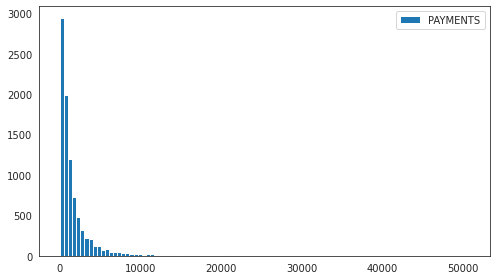

In [124]:
get_col_stats('PAYMENTS', df = df, )

Outlier low and high thresholds: -775.4998417500001 1727.24150625
MINIMUM_PAYMENTS min and max values: 0.0 76406.20752
Number of detected potential outliers: 899 or 10.0 % of dataset values
Number of values greater than 25000:  18
Initiated with figsize (7, 4)


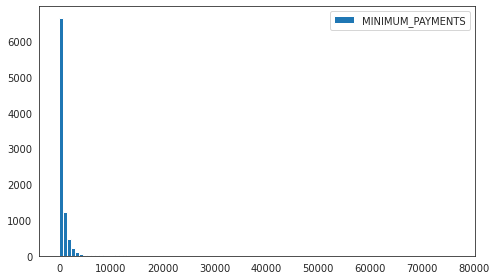

In [128]:
get_col_stats('MINIMUM_PAYMENTS', df = df, maxval = 25000)

Outlier low and high thresholds: 12.0 12.0
TENURE min and max values: 6.0 12.0
Number of detected potential outliers: 1366 or 15.3 % of dataset values
Number of values greater than 10000:  0
Initiated with figsize (7, 4)


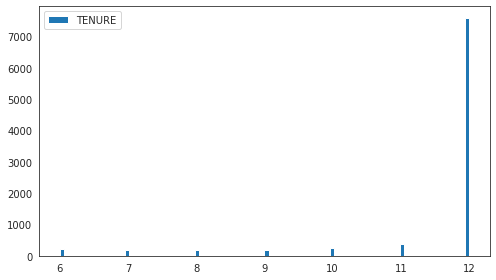

In [129]:
get_col_stats('TENURE', df = df)

### EDA 
#### Explorations we would like to conduct to inform our feature engineering and clustering approaches:

#### Transaction amount & demographic variables:
- TENURE vs CREDIT_LIMIT
- TENURE vs PURCHASES
- TENURE vs PAYMENTS
- TENURE vs CASH_ADVANCE
- CREDIT_LIMIT vs PURCHASES
- CREDIT_LIMIT vs CASH_ADVANCE
- CREDIT_LIMIT vs PAYMENTS

#### Frequency variables:
- PURCHASES_INSTALLMENTS_FREQUENCY vs INSTALLMENTS_PURCHASES 
- ONEOFF_PURCHASES_FREQUENCY vs ONEOFF_PURCHASES

#### EDA - Tenure

Initiated with figsize (10, 6)


(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA CREDIT_LIMIT vs TENURE'}, xlabel='TENURE', ylabel='CREDIT_LIMIT'>)

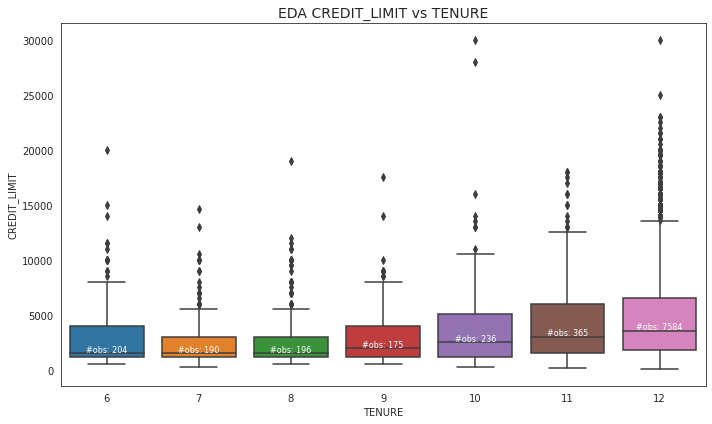

In [392]:
#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

viz1 = Viz(df = df)
viz1.make_boxplot(x = 'TENURE',y = 'CREDIT_LIMIT', xlabel = ('TENURE', 10), ylabel = ('CREDIT_LIMIT',10), title = ('EDA CREDIT_LIMIT vs TENURE', 14))

Initiated with figsize (10, 6)


(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA CREDIT_LIMIT vs PURCHASES'}, xlabel='TENURE', ylabel='PURCHASES'>)

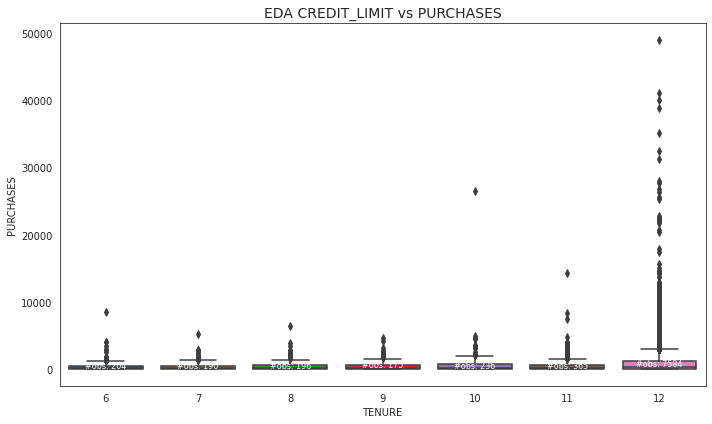

In [395]:
viz1.make_boxplot(x = 'TENURE',y = 'PURCHASES', xlabel = ('TENURE', 10), ylabel = ('PURCHASES',10), title = ('EDA CREDIT_LIMIT vs PURCHASES', 14))

Initiated with figsize (10, 6)


(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA CREDIT_LIMIT vs PAYMENTS'}, xlabel='TENURE', ylabel='PAYMENTS'>)

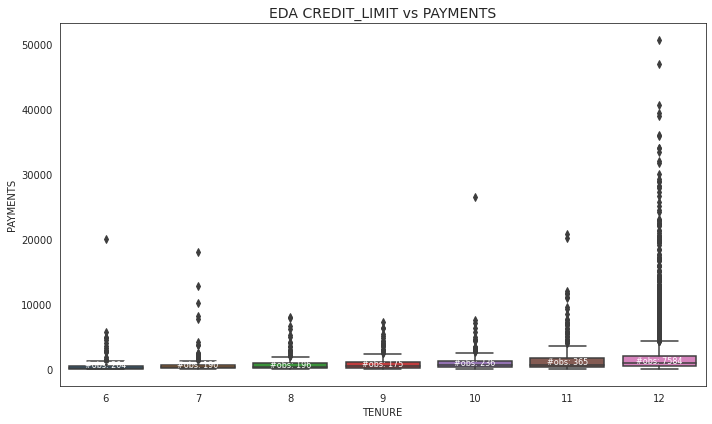

In [393]:
viz1 = Viz(df = df)
viz1.make_boxplot(x = 'TENURE',y = 'PAYMENTS', xlabel = ('TENURE', 10), ylabel = ('PAYMENTS',10), title = ('EDA CREDIT_LIMIT vs PAYMENTS', 14))

Initiated with figsize (10, 6)


(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA CASH_ADVANCE vs TENURE'}, xlabel='TENURE', ylabel='CASH_ADVANCE'>)

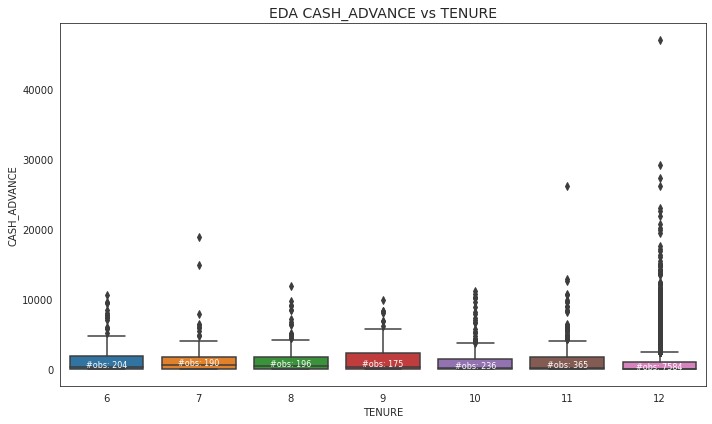

In [79]:
viz1 = Viz(df = df)
viz1.make_boxplot(x = 'TENURE', y = 'CASH_ADVANCE', xlabel = ('TENURE', 10), ylabel = ('CASH_ADVANCE',10), title = ('EDA CASH_ADVANCE vs TENURE', 14))

In [95]:
dfg3 = df.groupby('TENURE')['CASH_ADVANCE_FREQUENCY'].mean().reset_index()
dfg4 = df.groupby('TENURE')['CASH_ADVANCE'].mean().reset_index()
dfg5 = df.groupby('TENURE')['CASH_ADVANCE'].median().reset_index()

Initiated with figsize (10, 6)


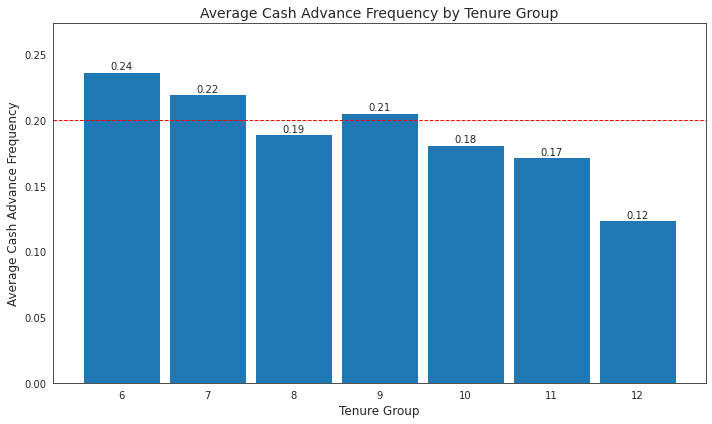

In [88]:
#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

viz5 = Viz(df = dfg3)
viz5.make_barplot(x = 'TENURE', height = 'CASH_ADVANCE_FREQUENCY', df = None, barwidth = 0.9, ylim_scalefactor = 1.1, barh = False, # hlines = [dfg2['CREDIT_LIMIT'].mean()],
                  label_adj = 0, annots = True, title = ('Average Cash Advance Frequency by Tenure Group',14), xlabel = ('Tenure Group', 12), ylabel = ('Average Cash Advance Frequency', 12))
plt.axhline(y = 0.20, linestyle = '--', color = 'red', linewidth = 1)
# plt.text(0.05, hline + 0.025, str(hline), transform = trans, fontsize = 10, color = 'black')

Initiated with figsize (10, 6)


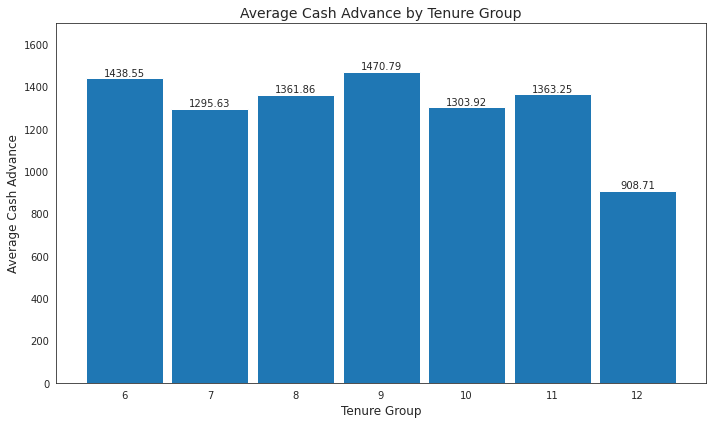

In [92]:
#utils2.py package can be found under https://github.com/philippe-heitzmann/Object_Detection
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

viz5 = Viz(df = dfg4)
viz5.make_barplot(x = 'TENURE', height = 'CASH_ADVANCE', df = None, barwidth = 0.9, ylim_scalefactor = 1.1, barh = False, # hlines = [dfg2['CREDIT_LIMIT'].mean()],
                  label_adj = 0, annots = True, title = ('Average Cash Advance by Tenure Group',14), xlabel = ('Tenure Group', 12), ylabel = ('Average Cash Advance', 12))
plt.axhline(y = 0.20, linestyle = '--', color = 'red', linewidth = 1)
# plt.text(0.05, hline + 0.025, str(hline), transform = trans, fontsize = 10, color = 'black')

In [96]:
dfg5

,TENURE,CASH_ADVANCE
0,6,289.70
1,7,549.44
2,8,453.52
3,9,389.52
4,10,148.03
5,11,229.42
6,12,0.00


In [404]:
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

viz1 = Viz(df = df)

Initiated with figsize (10, 6)


#### EDA - Credit Limit

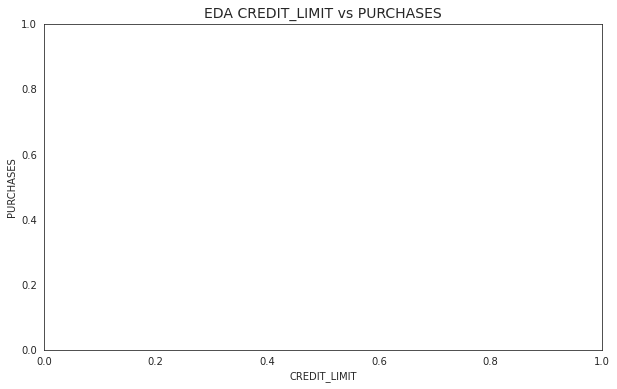

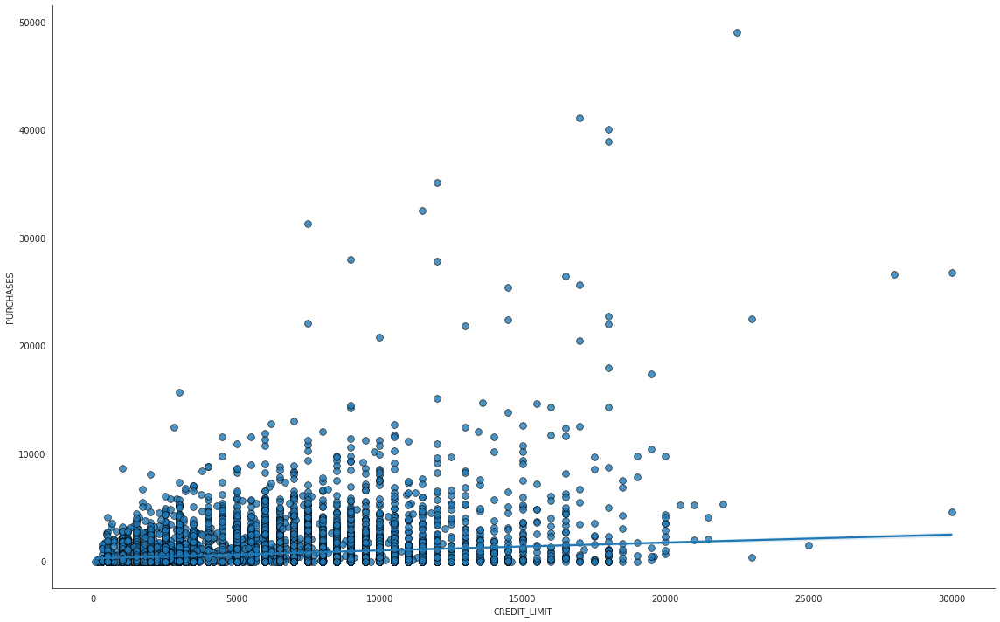

In [405]:
viz1.make_scatter(x = 'CREDIT_LIMIT', y = 'PURCHASES', bestfit = True, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('PURCHASES',10), title = ('EDA CREDIT_LIMIT vs PURCHASES', 14))

(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA CREDIT_LIMIT vs PURCHASES'}, xlabel='CREDIT_LIMIT', ylabel='PURCHASES'>)

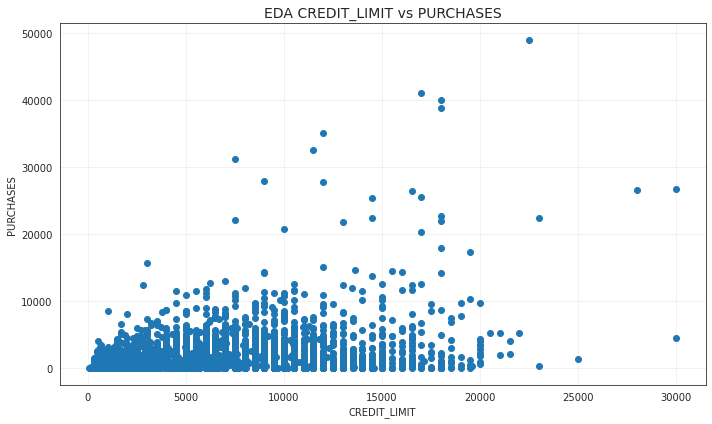

In [406]:
viz1.make_scatter('CREDIT_LIMIT', 'PURCHASES', xlabel = ('CREDIT_LIMIT', 10), ylabel = ('PURCHASES',10), title = ('EDA CREDIT_LIMIT vs PURCHASES', 14))

(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA CREDIT_LIMIT vs BALANCE'}, xlabel='CREDIT_LIMIT', ylabel='BALANCE'>)

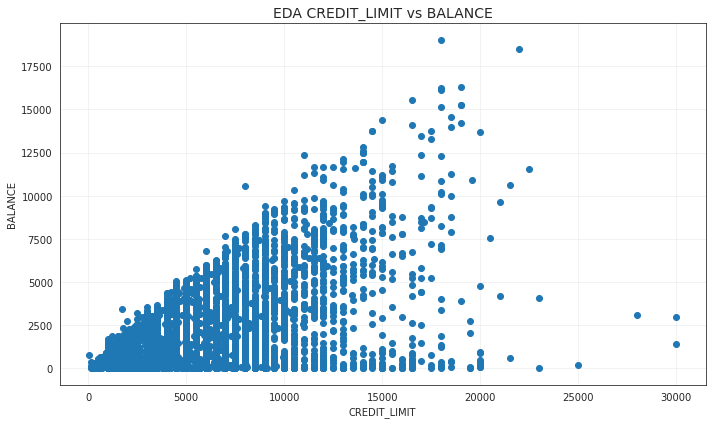

In [410]:
viz1.make_scatter('CREDIT_LIMIT', 'BALANCE', xlabel = ('CREDIT_LIMIT', 10), ylabel = ('BALANCE',10), title = ('EDA CREDIT_LIMIT vs BALANCE', 14))

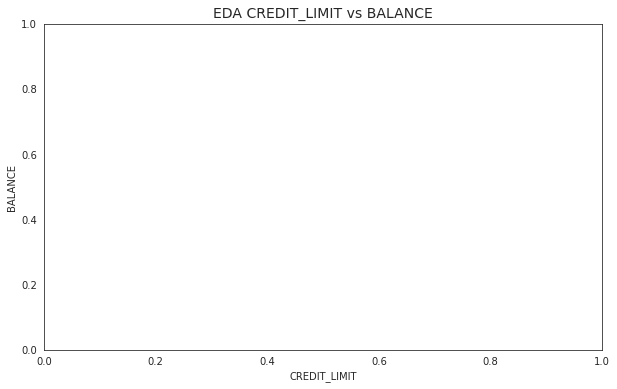

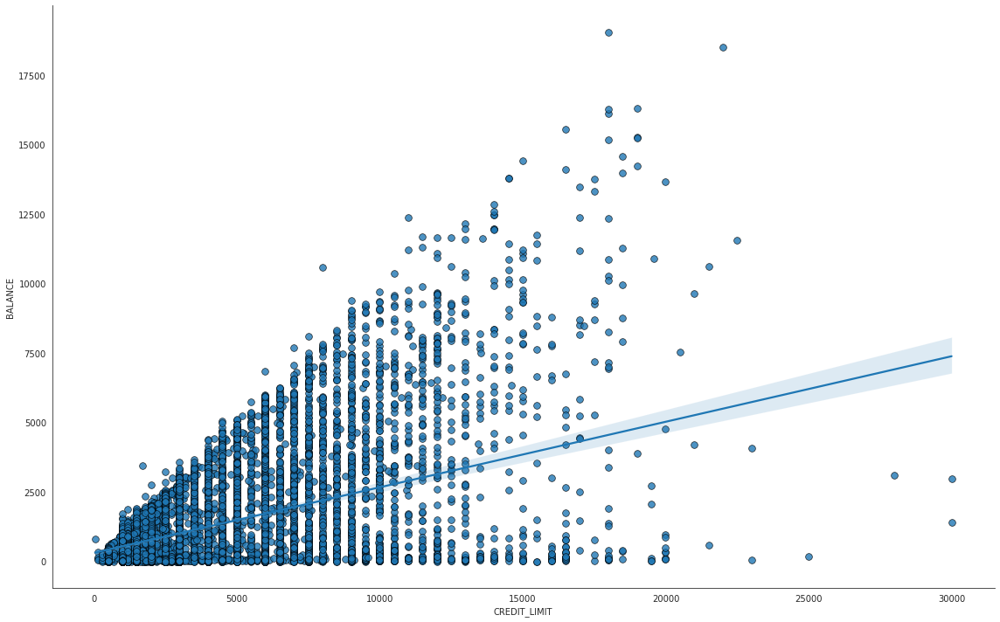

In [414]:
viz1.make_scatter(x = 'CREDIT_LIMIT', y = 'BALANCE', xlabel = ('CREDIT_LIMIT', 10), ylabel = ('BALANCE',10), title = ('EDA CREDIT_LIMIT vs BALANCE', 14), bestfit = True)

(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA CREDIT_LIMIT vs CASH_ADVANCE'}, xlabel='CREDIT_LIMIT', ylabel='CASH_ADVANCE'>)

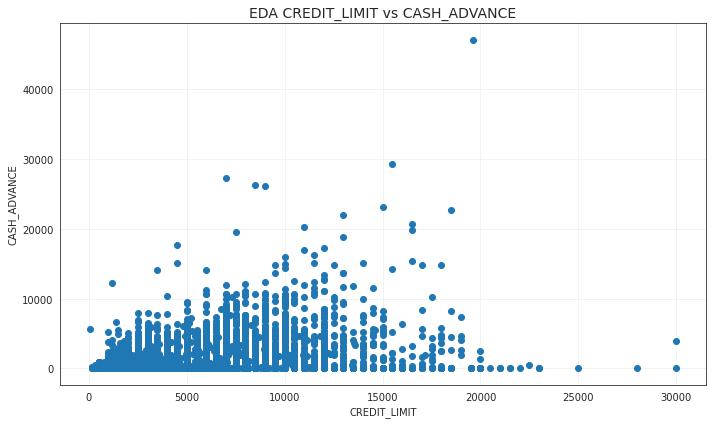

In [411]:
viz1.make_scatter('CREDIT_LIMIT', 'CASH_ADVANCE', xlabel = ('CREDIT_LIMIT', 10), ylabel = ('CASH_ADVANCE',10), title = ('EDA CREDIT_LIMIT vs CASH_ADVANCE', 14))

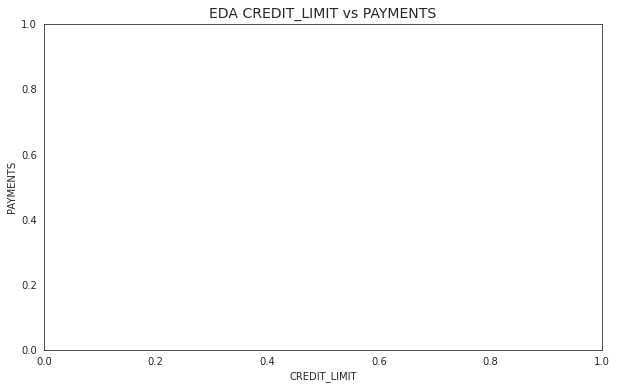

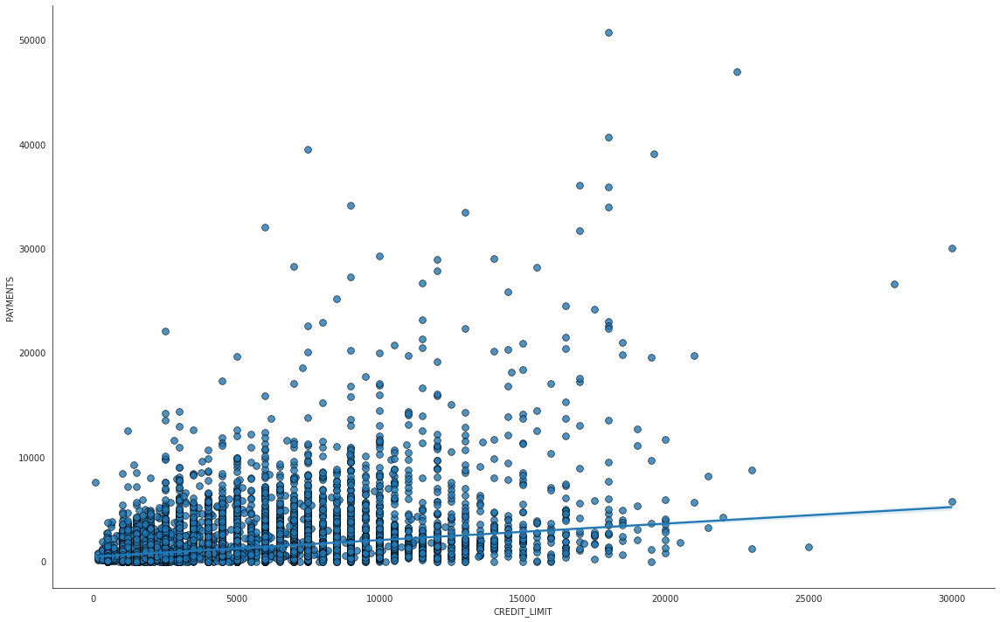

In [427]:
viz1.make_scatter(x = 'CREDIT_LIMIT', y = 'PAYMENTS', bestfit = True, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('PAYMENTS',10), title = ('EDA CREDIT_LIMIT vs PAYMENTS', 14))

#### EDA - ONEOFF_PURCHASES_FREQUENCY vs ONEOFF_PURCHASES

Initiated with figsize (10, 6)


(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA ONEOFF_PURCHASES_FREQUENCY vs ONEOFF_PURCHASES'}, xlabel='ONEOFF_PURCHASES_FREQUENCY_bins', ylabel='ONEOFF_PURCHASES'>)

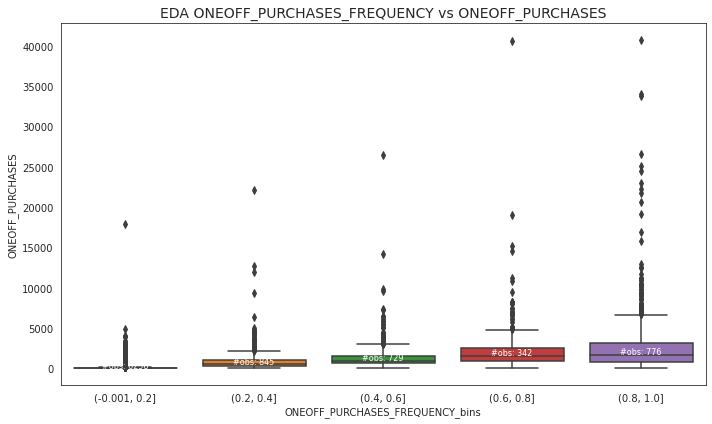

In [420]:
df['ONEOFF_PURCHASES_FREQUENCY_bins'] = pd.cut(df['ONEOFF_PURCHASES_FREQUENCY'], bins = 5)
viz1 = Viz(df = df)
viz1.make_boxplot(x = 'ONEOFF_PURCHASES_FREQUENCY_bins',y = 'ONEOFF_PURCHASES', xlabel = ('ONEOFF_PURCHASES_FREQUENCY', 10), ylabel = ('ONEOFF_PURCHASES',10), title = ('EDA ONEOFF_PURCHASES_FREQUENCY vs ONEOFF_PURCHASES', 14))

#### EDA - ONEOFF_PURCHASES_FREQUENCY vs ONEOFF_PURCHASES

Initiated with figsize (10, 6)


(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA PURCHASES_INSTALLMENTS_FREQUENCY vs INSTALLMENTS_PURCHASES'}, xlabel='PURCHASES_INSTALLMENTS_FREQUENCY_bins', ylabel='INSTALLMENTS_PURCHASES'>)

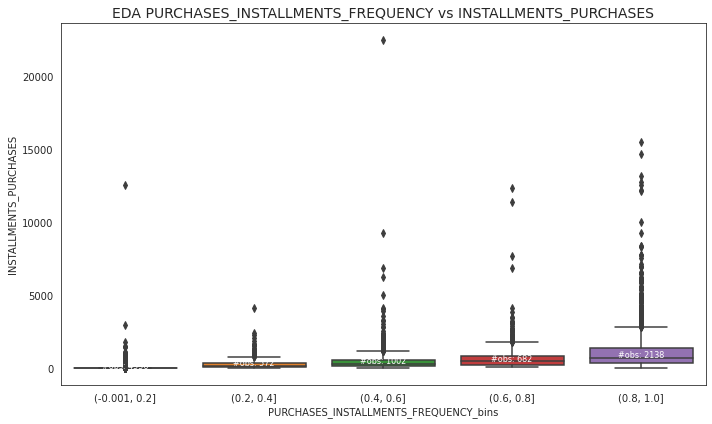

In [423]:
df['PURCHASES_INSTALLMENTS_FREQUENCY_bins'] = pd.cut(df['PURCHASES_INSTALLMENTS_FREQUENCY'], bins = 5)
viz1 = Viz(df = df)
viz1.make_boxplot(x = 'PURCHASES_INSTALLMENTS_FREQUENCY_bins',y = 'INSTALLMENTS_PURCHASES', xlabel = ('PURCHASES_INSTALLMENTS_FREQUENCY', 10), ylabel = ('INSTALLMENTS_PURCHASES',10), title = ('EDA PURCHASES_INSTALLMENTS_FREQUENCY vs INSTALLMENTS_PURCHASES', 14))

#### EDA - PURCHASES vs CASH_ADVANCE

(<Figure size 720x432 with 1 Axes>,
 <AxesSubplot:title={'center':'EDA PURCHASES vs CASH_ADVANCE'}, xlabel='PURCHASES', ylabel='CASH_ADVANCE'>)

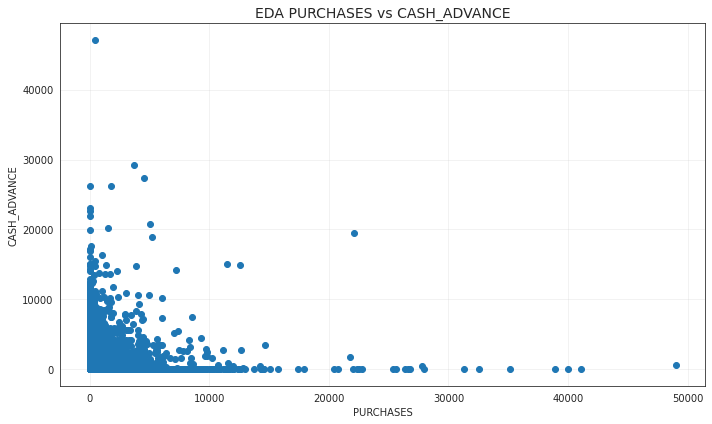

In [424]:
viz1.make_scatter('PURCHASES', 'CASH_ADVANCE', xlabel = ('PURCHASES', 10), ylabel = ('CASH_ADVANCE',10), title = ('EDA PURCHASES vs CASH_ADVANCE', 14))

### Feature Engineering

#Features to engineer

- ONEOFF_PURCHASES / PURCHASES
- INSTALLMENTS_PURCHASES / PURCHASES
- MINIMUM_PAYMENTS / PAYMENTS
- PURCHASES / PURCHASES_TRX
- CASH_ADVANCE / CASH_ADVANCE_TRX

In [99]:
df['ONEOFF_PURCHASES/PURCHASES'] = df['ONEOFF_PURCHASES'] / df['PURCHASES']
df['INSTALLMENTS_PURCHASES/PURCHASES'] = df['INSTALLMENTS_PURCHASES'] / df['PURCHASES']
df['MINIMUM_PAYMENTS/PAYMENTS'] = df['MINIMUM_PAYMENTS'] / df['PAYMENTS']
df['Average_Purchase_Amount'] = df['PURCHASES'] / df['PURCHASES_TRX']
df['Average_Cash_Advance_Amount'] = df['CASH_ADVANCE'] / df['CASH_ADVANCE_TRX']

In [171]:
print(df.loc[(df['ONEOFF_PURCHASES/PURCHASES'].isna()) & (df['PURCHASES'] == 0)].shape[0])
print(df.loc[(df['INSTALLMENTS_PURCHASES/PURCHASES'].isna()) & (df['PURCHASES'] == 0)].shape[0])
print(df.loc[(df['MINIMUM_PAYMENTS/PAYMENTS'].isna()) & (df['PAYMENTS'] == 0)].shape[0])
print(df.loc[(df['Average_Purchase_Amount'].isna()) & (df['PURCHASES_TRX'] == 0)].shape[0])
print(df.loc[(df['Average_Cash_Advance_Amount'].isna()) & (df['CASH_ADVANCE_TRX'] == 0)].shape[0])

2044
2042
240
2041
4628


In [100]:
#imputing below to zero given caused by division by zero erros 
df['ONEOFF_PURCHASES/PURCHASES'] = df['ONEOFF_PURCHASES/PURCHASES'].fillna(0)
df['INSTALLMENTS_PURCHASES/PURCHASES'] = df['INSTALLMENTS_PURCHASES/PURCHASES'].fillna(0)
df['MINIMUM_PAYMENTS/PAYMENTS'] = df['MINIMUM_PAYMENTS/PAYMENTS'].fillna(0)
df['Average_Purchase_Amount'] = df['Average_Purchase_Amount'].fillna(0)
df['Average_Cash_Advance_Amount'] = df['Average_Cash_Advance_Amount'].fillna(0)

### Clustering

In [101]:
df.drop(['CUST_ID'], axis = 1, inplace = True)

In [188]:
infmask = np.isinf(X)
df.loc[infmask]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,ONEOFF_PURCHASES/PURCHASES,INSTALLMENTS_PURCHASES/PURCHASES,MINIMUM_PAYMENTS/PAYMENTS,Average_Purchase_Amount,Average_Cash_Advance_Amount
1458,4.382924,0.272727,130.24,0.00,152.24,0.0,0.083333,0.000000,0.083333,0.0,0,0,14000.0,28988.973880,1092.184812,0.500000,12,0.0,1.168919,0.037676,inf,0.0
3590,1.869435,0.454545,0.24,0.24,0.00,0.0,0.083333,0.083333,0.000000,0.0,0,0,3000.0,150.381107,53.294711,0.000000,12,1.0,0.000000,0.354398,inf,0.0
4497,72.425884,1.000000,655.68,0.00,655.68,0.0,1.000000,0.000000,1.000000,0.0,0,0,1000.0,718.537117,162.732686,0.333333,12,0.0,1.000000,0.226478,inf,0.0


In [107]:
df['INSTALLMENTS_PURCHASES/PURCHASES'].replace([np.inf, -np.inf], 1, inplace=True)
df['Average_Purchase_Amount'].replace([np.inf, -np.inf], 0, inplace=True)

In [108]:
from sklearn.preprocessing import StandardScaler
X = np.asarray(df)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X.shape

(8950, 22)

In [109]:
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

fig, intertia = get_elbow_plot(X, start = 1, end = 11, elbow_annot = 4, random_state = 42)
fig

In [208]:
cols = list(df.columns)

In [216]:
print(cols)

['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE', 'ONEOFF_PURCHASES/PURCHASES', 'INSTALLMENTS_PURCHASES/PURCHASES', 'MINIMUM_PAYMENTS/PAYMENTS', 'Average_Purchase_Amount', 'Average_Cash_Advance_Amount']


In [113]:
cols2 = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE', 'ONEOFF_PURCHASES/PURCHASES', 'INSTALLMENTS_PURCHASES/PURCHASES', 'MINIMUM_PAYMENTS/PAYMENTS', 'Average_Purchase_Amount', 'Average_Cash_Advance_Amount']

#### KMeans - 3 clusters

In [110]:
fig, polar, clusters, scaler = get_kmeans(data = df, cols = list(df.columns), n_clusters = 3, random_state = 42)
fig

0.3 sec to complete <function get_kmeans at 0x7faaa19f69d0>


In [114]:
fig, polar, clusters, scaler = get_kmeans(data = df, cols = cols2, n_clusters = 3, random_state = 42)
fig

0.2 sec to complete <function get_kmeans at 0x7faaa19f69d0>


In [220]:
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

dfg, data_inv = inv_transform(data = df, scaler = scaler, cols = cols, clusters = clusters)
dfg.head()

,labels_,BALANCE_mean,BALANCE_count,BALANCE_FREQUENCY_mean,BALANCE_FREQUENCY_median,BALANCE_FREQUENCY_std,PURCHASES_mean,PURCHASES_median,PURCHASES_std,ONEOFF_PURCHASES_mean,ONEOFF_PURCHASES_median,ONEOFF_PURCHASES_std,INSTALLMENTS_PURCHASES_mean,INSTALLMENTS_PURCHASES_median,INSTALLMENTS_PURCHASES_std,CASH_ADVANCE_mean,CASH_ADVANCE_median,CASH_ADVANCE_std,PURCHASES_FREQUENCY_mean,PURCHASES_FREQUENCY_median,PURCHASES_FREQUENCY_std,ONEOFF_PURCHASES_FREQUENCY_mean,ONEOFF_PURCHASES_FREQUENCY_median,ONEOFF_PURCHASES_FREQUENCY_std,PURCHASES_INSTALLMENTS_FREQUENCY_mean,PURCHASES_INSTALLMENTS_FREQUENCY_median,PURCHASES_INSTALLMENTS_FREQUENCY_std,CASH_ADVANCE_FREQUENCY_mean,CASH_ADVANCE_FREQUENCY_median,CASH_ADVANCE_FREQUENCY_std,CASH_ADVANCE_TRX_mean,CASH_ADVANCE_TRX_median,CASH_ADVANCE_TRX_std,PURCHASES_TRX_mean,PURCHASES_TRX_median,PURCHASES_TRX_std,CREDIT_LIMIT_mean,CREDIT_LIMIT_median,CREDIT_LIMIT_std,PAYMENTS_mean,PAYMENTS_median,PAYMENTS_std,MINIMUM_PAYMENTS_mean,MINIMUM_PAYMENTS_median,MINIMUM_PAYMENTS_std,PRC_FULL_PAYMENT_mean,PRC_FULL_PAYMENT_median,PRC_FULL_PAYMENT_std,TENURE_mean,TENURE_median,TENURE_std,ONEOFF_PURCHASES/PURCHASES_mean,ONEOFF_PURCHASES/PURCHASES_median,ONEOFF_PURCHASES/PURCHASES_std,INSTALLMENTS_PURCHASES/PURCHASES_mean,INSTALLMENTS_PURCHASES/PURCHASES_median,INSTALLMENTS_PURCHASES/PURCHASES_std,MINIMUM_PAYMENTS/PAYMENTS_mean,MINIMUM_PAYMENTS/PAYMENTS_median,MINIMUM_PAYMENTS/PAYMENTS_std,Average_Purchase_Amount_mean,Average_Purchase_Amount_median,Average_Purchase_Amount_std,Average_Cash_Advance_Amount_mean,Average_Cash_Advance_Amount_median,Average_Cash_Advance_Amount_std,labels_mean,labels_median,labels_std,perc
0,0,1461462.10,3121,1.08,1.11,0.06,1442631.76,986620.50,1381467.05,182010.45,592.44,399016.05,512196.59,349502.25,509258.48,468965.57,978.87,1446014.23,0.79,0.82,0.11,0.22,0.20,0.04,0.64,0.66,0.12,0.14,0.14,0.02,8.66,3.25,15.83,370.81,312.98,298.03,12282493.66,9100602.83,9970861.70,2693621.77,1728683.96,3435625.19,1556535.38,413806.97,5165108.61,0.22,0.15,0.10,26.95,27.58,1.79,0.43,0.38,0.09,0.78,0.82,0.09,29.81,8.85,174.21,8661.84,6325.30,8792.77,39084.22,208.91,131056.36,0.00,0.00,0.00,0.35
1,1,4066001.02,4303,1.08,1.11,0.06,622970.56,75781.24,1069786.60,428807.85,592.44,779709.13,30472.41,411.07,111199.60,3381465.18,1487005.33,5215201.60,0.55,0.52,0.09,0.24,0.20,0.05,0.38,0.36,0.05,0.18,0.17,0.04,39.90,23.72,57.54,91.61,39.57,132.90,15559668.17,10919824.54,12320694.13,4533832.22,2215952.30,7150101.25,2052737.95,985790.69,5031518.14,0.17,0.15,0.04,26.75,27.58,1.99,0.58,0.38,0.20,0.42,0.39,0.09,38.90,14.11,444.42,12668.56,3284.19,29722.18,181374.52,83055.21,372941.46,1.00,1.00,0.00,0.48
2,2,4653250.98,1526,1.11,1.11,0.02,7869579.17,5651958.28,8649552.79,4189281.47,2729328.92,5480400.17,1049092.35,578540.21,1590874.61,1550906.83,978.87,4703859.77,0.86,0.89,0.05,0.42,0.43,0.08,0.61,0.66,0.15,0.15,0.14,0.03,18.86,3.25,40.83,1214.02,884.68,1038.18,26936718.06,25473598.22,15783842.33,11143059.41,6980034.57,13948247.38,2458581.45,845354.02,6936549.45,0.23,0.15,0.11,27.40,27.58,0.91,0.68,0.70,0.11,0.52,0.50,0.11,16.17,4.47,257.49,16539.12,10779.06,34657.69,66115.92,208.91,170270.53,2.00,2.00,0.00,0.17


#### KMeans - 4 clusters
#this onek

In [111]:
fig, polar, clusters, scaler = get_kmeans(data = df, cols = list(df.columns), n_clusters = 4, random_state = 42)
fig

0.2 sec to complete <function get_kmeans at 0x7faaa19f69d0>


In [213]:
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

dfg, data_inv = inv_transform(data = df, scaler = scaler, cols = cols, clusters = clusters)
dfg.head()

,labels_,BALANCE_mean,BALANCE_count,BALANCE_FREQUENCY_mean,BALANCE_FREQUENCY_median,BALANCE_FREQUENCY_std,PURCHASES_mean,PURCHASES_median,PURCHASES_std,ONEOFF_PURCHASES_mean,ONEOFF_PURCHASES_median,ONEOFF_PURCHASES_std,INSTALLMENTS_PURCHASES_mean,INSTALLMENTS_PURCHASES_median,INSTALLMENTS_PURCHASES_std,CASH_ADVANCE_mean,CASH_ADVANCE_median,CASH_ADVANCE_std,PURCHASES_FREQUENCY_mean,PURCHASES_FREQUENCY_median,PURCHASES_FREQUENCY_std,ONEOFF_PURCHASES_FREQUENCY_mean,ONEOFF_PURCHASES_FREQUENCY_median,ONEOFF_PURCHASES_FREQUENCY_std,PURCHASES_INSTALLMENTS_FREQUENCY_mean,PURCHASES_INSTALLMENTS_FREQUENCY_median,PURCHASES_INSTALLMENTS_FREQUENCY_std,CASH_ADVANCE_FREQUENCY_mean,CASH_ADVANCE_FREQUENCY_median,CASH_ADVANCE_FREQUENCY_std,CASH_ADVANCE_TRX_mean,CASH_ADVANCE_TRX_median,CASH_ADVANCE_TRX_std,PURCHASES_TRX_mean,PURCHASES_TRX_median,PURCHASES_TRX_std,CREDIT_LIMIT_mean,CREDIT_LIMIT_median,CREDIT_LIMIT_std,PAYMENTS_mean,PAYMENTS_median,PAYMENTS_std,MINIMUM_PAYMENTS_mean,MINIMUM_PAYMENTS_median,MINIMUM_PAYMENTS_std,PRC_FULL_PAYMENT_mean,PRC_FULL_PAYMENT_median,PRC_FULL_PAYMENT_std,TENURE_mean,TENURE_median,TENURE_std,ONEOFF_PURCHASES/PURCHASES_mean,ONEOFF_PURCHASES/PURCHASES_median,ONEOFF_PURCHASES/PURCHASES_std,INSTALLMENTS_PURCHASES/PURCHASES_mean,INSTALLMENTS_PURCHASES/PURCHASES_median,INSTALLMENTS_PURCHASES/PURCHASES_std,MINIMUM_PAYMENTS/PAYMENTS_mean,MINIMUM_PAYMENTS/PAYMENTS_median,MINIMUM_PAYMENTS/PAYMENTS_std,Average_Purchase_Amount_mean,Average_Purchase_Amount_median,Average_Purchase_Amount_std,Average_Cash_Advance_Amount_mean,Average_Cash_Advance_Amount_median,Average_Cash_Advance_Amount_std,labels_mean,labels_median,labels_std,perc
0,0,9526866.21,1179,1.10,1.11,0.03,949433.35,48348.39,1746096.54,441229.46,592.44,975160.09,161848.09,411.07,394244.07,9723423.07,7999771.69,7557747.97,0.60,0.52,0.14,0.24,0.20,0.06,0.43,0.36,0.12,0.23,0.23,0.05,99.44,78.32,86.02,186.05,39.57,332.12,27500370.28,25473598.22,13385325.81,10369619.46,5746234.96,12573626.78,4707538.38,3071613.89,9132635.29,0.16,0.15,0.03,26.75,27.58,1.97,0.51,0.38,0.18,0.48,0.39,0.15,64.34,17.83,802.43,7601.39,1739.57,15418.48,343729.80,184543.84,614209.04,0.00,0.00,0.00,0.13
1,1,2363907.36,3550,1.08,1.11,0.06,776303.33,186228.41,1219200.80,555909.54,124230.58,897377.36,26121.35,411.07,84545.68,1316925.80,406679.63,1837561.79,0.57,0.52,0.10,0.25,0.23,0.07,0.38,0.36,0.05,0.16,0.15,0.03,19.85,10.07,21.51,112.69,39.57,153.35,12187434.94,9100602.83,9684000.59,2928959.87,1730209.00,3713473.15,1252166.09,687677.71,2600012.71,0.17,0.15,0.05,26.80,27.58,1.93,0.61,0.71,0.20,0.41,0.39,0.06,26.75,12.37,155.19,14291.59,5790.05,31638.49,119178.10,41634.09,197879.77,1.00,1.00,0.00,0.40
2,2,1357899.34,3019,1.08,1.11,0.06,1447045.65,971408.51,1388897.33,177923.09,592.44,402704.95,516306.89,357532.32,504181.72,385780.32,978.87,1146071.23,0.79,0.82,0.11,0.22,0.20,0.04,0.64,0.66,0.11,0.14,0.14,0.02,8.05,3.25,13.60,375.82,312.98,304.55,12213317.47,9100602.83,9917815.04,2654116.48,1716199.00,3348169.02,1503640.87,412778.15,4728417.51,0.23,0.15,0.10,26.95,27.58,1.80,0.42,0.38,0.08,0.78,0.82,0.08,30.95,8.69,181.53,8588.40,6258.82,8857.39,35364.65,208.91,116492.09,2.00,2.00,0.00,0.34
3,3,4521249.67,1202,1.11,1.11,0.02,9108306.43,6646335.29,9292599.10,4804675.64,3270256.17,5980357.60,1238205.51,726011.43,1723533.72,896087.23,978.87,2669407.29,0.87,0.89,0.05,0.42,0.45,0.08,0.63,0.69,0.14,0.15,0.14,0.03,12.91,3.25,26.22,1372.75,1058.67,1095.13,28146431.45,25473598.22,15824219.19,11883374.13,7856983.29,14041210.96,2419138.49,797717.09,7366216.19,0.24,0.18,0.11,27.45,27.58,0.78,0.67,0.69,0.11,0.53,0.51,0.11,17.36,4.05,290.09,17603.60,11307.83,38257.88,56758.52,208.91,151167.07,3.00,3.00,0.00,0.13


In [118]:
fig, polar, clusters, scaler = get_kmeans(data = df, cols = cols2, n_clusters = 4, random_state = 42)
fig

0.2 sec to complete <function get_kmeans at 0x7faaa0f530d0>


In [132]:
df2 = df.drop(['PURCHASES_FREQUENCY','ONEOFF_PURCHASES_FREQUENCY'], axis = 1)
df2.shape

(8950, 20)

In [149]:
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

X2, scaler = scale(df = df2, cols = df2.columns)
dfg, data_inv = inv_transform(data = X2, scaler = scaler, cols = cols2, clusters = clusters)
dfg.head()

,labels_,BALANCE_mean,BALANCE_count,BALANCE_FREQUENCY_mean,PURCHASES_mean,CASH_ADVANCE_mean,PURCHASES_FREQUENCY_mean,ONEOFF_PURCHASES_FREQUENCY_mean,PURCHASES_INSTALLMENTS_FREQUENCY_mean,CASH_ADVANCE_FREQUENCY_mean,CASH_ADVANCE_TRX_mean,PURCHASES_TRX_mean,CREDIT_LIMIT_mean,PAYMENTS_mean,MINIMUM_PAYMENTS_mean,PRC_FULL_PAYMENT_mean,TENURE_mean,ONEOFF_PURCHASES/PURCHASES_mean,INSTALLMENTS_PURCHASES/PURCHASES_mean,MINIMUM_PAYMENTS/PAYMENTS_mean,Average_Purchase_Amount_mean,Average_Cash_Advance_Amount_mean,labels_mean,perc
0,0,4801.01,1067,0.96,596.88,358.28,238.70,4934.43,0.20,0.48,14.75,8.67,7937.73,3963.45,2280.42,0.04,11.42,0.31,0.22,4.16,51.69,661.31,0.00,0.12
1,1,632.97,2926,0.84,657.06,85.11,572.48,182.47,0.69,0.04,0.70,13.87,3268.71,895.44,643.48,0.25,11.52,0.08,0.92,1.60,53.27,63.32,1.00,0.33
2,2,1189.00,3395,0.83,305.75,281.47,24.40,729.77,0.03,0.15,2.81,2.86,3309.04,1028.71,556.55,0.05,11.39,0.50,0.04,1.41,88.99,244.51,2.00,0.38
3,3,1914.64,1562,0.98,3445.10,2378.61,1066.87,310.10,0.59,0.06,1.13,46.17,7013.98,3309.93,805.78,0.27,11.86,0.72,0.28,0.46,94.74,95.20,3.00,0.17


In [ ]:
PURCHASES_mean CASH_ADVANCE_mean PURCHASES_FREQUENCY_mean ONEOFF_PURCHASES_FREQUENCY_mean BALANCE perc BALANCE_FREQUENCY_mean

In [ ]:
# purple - older tenured, higher credit limit customers that make high numbers of all types of purchases (oneoff and installments especially)
# red - medium tenured customers that make high numbers of installment purchases
# blue - lower tenured, high credit limit and high balance customers that make high numbers of cash advance transactions 
# green - lower tenured, lower balance customers making lower numbers of purchases  

#### KMeans - 5 clusters

In [215]:
fig, polar, clusters, scaler = get_kmeans(data = df, cols = list(df.columns), n_clusters = 5, random_state = 42)
fig

1.3 sec to complete <function get_kmeans at 0x7fabe8d3dd30>


In [153]:
fig, polar, clusters, scaler = get_kmeans(data = df, cols = cols2, n_clusters = 5, random_state = 42)
fig

0.2 sec to complete <function get_kmeans at 0x7faaa0f4e4c0>


#### KMeans - 6 clusters

In [217]:
fig, polar, clusters, scaler = get_kmeans(data = df, cols = list(df.columns), n_clusters = 6, random_state = 42)
fig

0.8 sec to complete <function get_kmeans at 0x7fabe8d3dd30>


#### HDBSCAN
https://pypi.org/project/hdbscan/

In [249]:
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

min_cluster_sizes = [100,125,150,200,250] #,500,1000,2500]
min_sample_sizes = [5,10,15,20,25,30,35,40,45,50] #2,3,
dfsh = HDBSCAN_hyperparameter_search(df = df, min_cluster_sizes = min_cluster_sizes, min_sample_sizes = min_sample_sizes, scaler = scaler, cols = cols)
print(len(dfsh))

[-1  0  1  2  3  4  5  6  7]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 5 min_samples
[-1  0  1  2  3  4  5]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 10 min_samples
[-1  0  1  2  3  4  5]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 15 min_samples
[-1  0  1  2  3  4  5]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 20 min_samples
[-1  0  1  2  3  4  5]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 25 min_samples
[-1  0  1  2  3  4  5]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 30 min_samples
[-1  0  1  2  3  4  5]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 35 min_samples
[-1  0  1  2  3  4]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 40 min_samples
[-1  0  1  2  3  4]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 45 min_samples
[-1  0  1  2  3  4]
1.0 sec to complete HDBSCAN with 100 min_cluster_size and 50 min_samples
[-1  0  1  2  3  4  5]
1.0 sec to complete H

In [ ]:
dfgs = [x[0] for x in dfsh]

In [252]:
print(dfsh[0])

(   labels_  BALANCE_mean  BALANCE_count  BALANCE_FREQUENCY_mean  \
0       -1    3812489.21           7380                    1.09   
1        0     105883.32            157                    1.04   
2        1      95536.04            199                    1.02   
3        2    3135656.49            169                    1.11   
4        3    2171860.32            176                    1.11   
5        4      76133.85            307                    1.05   
6        5     111716.80            296                    1.06   
7        6      59047.86            129                    1.03   
8        7      73351.04            137                    1.04   

   PURCHASES_mean  ONEOFF_PURCHASES_mean  INSTALLMENTS_PURCHASES_mean  \
0      2496777.35             1184033.24                    412301.74   
1       657955.16              109004.97                    219403.08   
2       640573.07               91753.48                    221849.33   
3        49532.19               2980

In [253]:
dfsh = sorted(dfsh, key = lambda x: x[0].iloc[0,-1], reverse = False)
print(dfsh[0])

(   labels_  BALANCE_mean  BALANCE_count  BALANCE_FREQUENCY_mean  \
0       -1    4599020.21           5572                    1.10   
1        0     192833.13            614                    1.04   
2        1    1235147.05           2764                    1.07   

   PURCHASES_mean  ONEOFF_PURCHASES_mean  INSTALLMENTS_PURCHASES_mean  \
0      3091075.16             1500807.06                    491226.24   
1       864536.49              232483.58                    239696.93   
2       520180.04              108833.74                    161474.93   

   CASH_ADVANCE_mean  PURCHASES_FREQUENCY_mean  \
0         3085719.99                      0.70   
1           17505.10                      0.71   
2          425611.47                      0.66   

   ONEOFF_PURCHASES_FREQUENCY_mean  PURCHASES_INSTALLMENTS_FREQUENCY_mean  \
0                             0.28                                   0.51   
1                             0.25                                   0.53   
2    

In [254]:
#following viz creation process from https://nbviewer.org/github/scikit-learn-contrib/hdbscan/blob/master/notebooks/How%20HDBSCAN%20Works.ipynb
clusterer = hdbscan.HDBSCAN(min_cluster_size = 150, min_samples = 5, gen_min_span_tree=True)
cluster_labels = clusterer.fit_predict(df[cols])

In [266]:
clusterer.minimum_spanning_tree_.plot??

<AxesSubplot:>

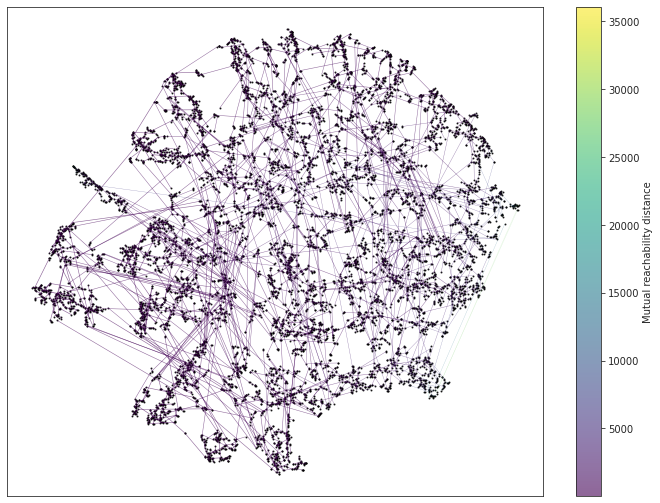

In [267]:
fig, ax = plt.subplots(figsize = (12,9))
clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis', edge_alpha=0.6, node_size=1, edge_linewidth=0.1, axis = ax)

<AxesSubplot:ylabel='$\\lambda$ value'>

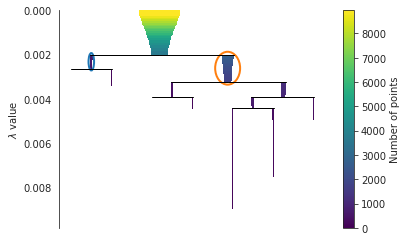

In [259]:
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())

### Hierarchical Clustering

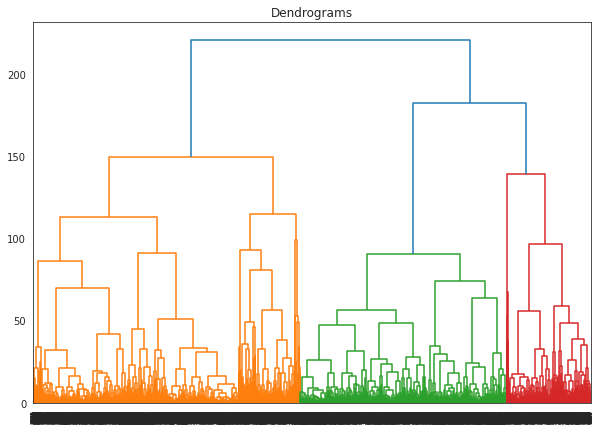

In [264]:
scaler.fit(df)
X = scaler.transform(df)
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(X, method='ward'))

In [308]:
from sklearn.preprocessing import normalize
data_scaled = normalize(df)

In [272]:
df_scaled = pd.DataFrame(data = X, columns = cols)
df_scaled.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,ONEOFF_PURCHASES/PURCHASES,INSTALLMENTS_PURCHASES/PURCHASES,MINIMUM_PAYMENTS/PAYMENTS,Average_Purchase_Amount,Average_Cash_Advance_Amount
0,-0.73,-0.25,-0.42,-0.36,-0.35,-0.47,-0.81,-0.68,-0.71,-0.68,-0.48,-0.51,-0.96,-0.53,-0.30,-0.53,0.36,-0.89,1.41,-0.05,-0.16,-0.39
1,0.79,0.13,-0.47,-0.36,-0.45,2.61,-1.22,-0.68,-0.92,0.57,0.11,-0.59,0.69,0.82,0.10,0.23,0.36,-0.89,-0.91,-0.07,-0.46,2.62
2,0.45,0.52,-0.11,0.11,-0.45,-0.47,1.27,2.67,-0.92,-0.68,-0.48,-0.11,0.83,-0.38,-0.09,-0.53,0.36,1.46,-0.91,-0.03,-0.06,-0.39
3,0.05,-1.02,0.23,0.55,-0.45,-0.37,-1.01,-0.40,-0.92,-0.26,-0.33,-0.55,0.83,-0.60,-0.36,-0.53,0.36,1.46,-0.91,-0.09,8.88,-0.01
4,-0.36,0.52,-0.46,-0.35,-0.45,-0.47,-1.01,-0.40,-0.92,-0.68,-0.48,-0.55,-0.91,-0.36,-0.25,-0.53,0.36,1.46,-0.91,-0.07,-0.36,-0.39


In [311]:
df_scaled2 = pd.DataFrame(data = data_scaled, columns = cols)
df_scaled2.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,ONEOFF_PURCHASES/PURCHASES,INSTALLMENTS_PURCHASES/PURCHASES,MINIMUM_PAYMENTS/PAYMENTS,Average_Purchase_Amount,Average_Cash_Advance_Amount
count,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00,8950.00
mean,0.24,0.00,0.15,0.08,0.07,0.14,0.00,0.00,0.00,0.00,0.00,0.00,0.74,0.26,0.13,0.00,0.00,0.00,0.00,0.00,0.02,0.04
std,0.22,0.00,0.16,0.12,0.11,0.20,0.00,0.00,0.00,0.00,0.00,0.00,0.20,0.20,0.16,0.00,0.00,0.00,0.00,0.01,0.04,0.07
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.03,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.62,0.11,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.20,0.00,0.10,0.01,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.75,0.19,0.08,0.00,0.00,0.00,0.00,0.00,0.01,0.00
75%,0.43,0.00,0.25,0.11,0.11,0.24,0.00,0.00,0.00,0.00,0.00,0.00,0.93,0.37,0.15,0.00,0.00,0.00,0.00,0.00,0.02,0.04
max,0.76,0.00,0.71,0.64,0.58,0.81,0.00,0.00,0.00,0.00,0.02,0.06,1.00,0.98,0.99,0.00,0.04,0.00,0.00,0.91,0.49,0.57


#### N=2 Hierarchical Clustering Visualization - Purchases

In [315]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')  
cluster.fit_predict(df_scaled2)

array([1, 0, 0, ..., 1, 1, 0])

Initiated with figsize (10, 7)


(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by BALANCE vs PURCHASES'}, xlabel='PURCHASES', ylabel='BALANCE'>)

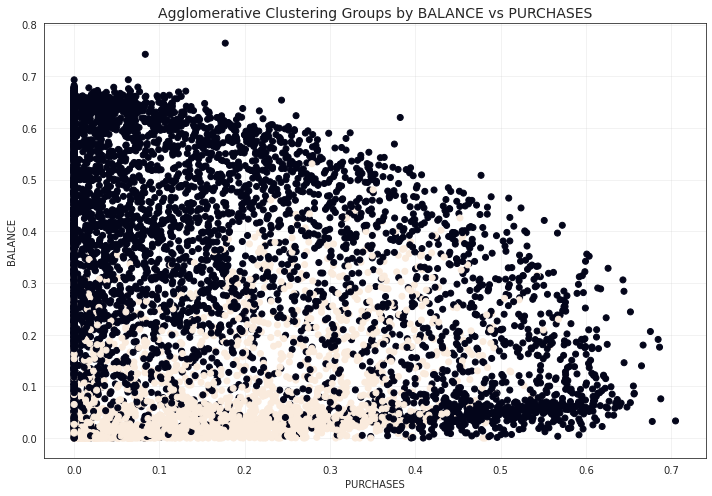

In [317]:
import sys
sys.path.append('/Users/Administrator/DS/DeepRoad/Object_Detection')
sys.path.append('/Users/phil0/DS/DeepRoad/Object_Detection')
import utils2
from importlib import reload
reload(utils2)
from utils2 import *

viz3 = Viz(df = df_scaled2, figsize = (10,7))
viz3.make_scatter('PURCHASES', 'BALANCE', c=cluster.labels_, xlabel = ('PURCHASES', 10), ylabel = ('BALANCE',10), title = ('Agglomerative Clustering Groups by BALANCE vs PURCHASES', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by BALANCE vs PURCHASES'}, xlabel='PURCHASES', ylabel='CASH_ADVANCE'>)

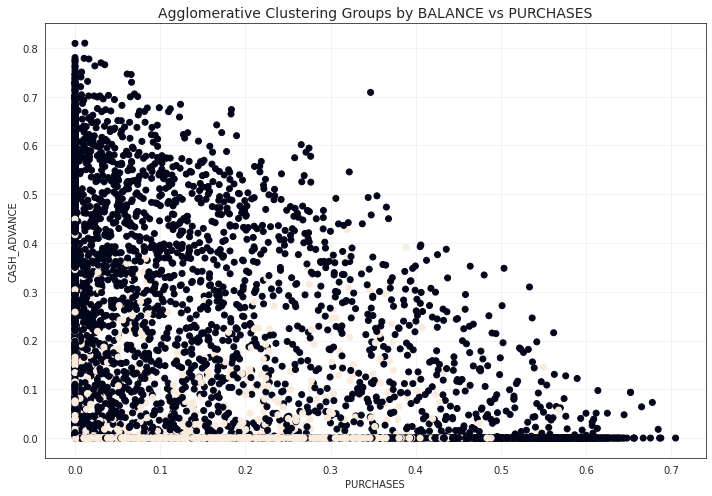

In [318]:
viz3.make_scatter('PURCHASES', 'CASH_ADVANCE', c=cluster.labels_, xlabel = ('PURCHASES', 10), ylabel = ('CASH_ADVANCE',10), title = ('Agglomerative Clustering Groups by BALANCE vs PURCHASES', 14))

#### N=2 Hierarchical Clustering Visualization - Payments

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by BALANCE vs PAYMENTS'}, xlabel='PURCHASES', ylabel='PAYMENTS'>)

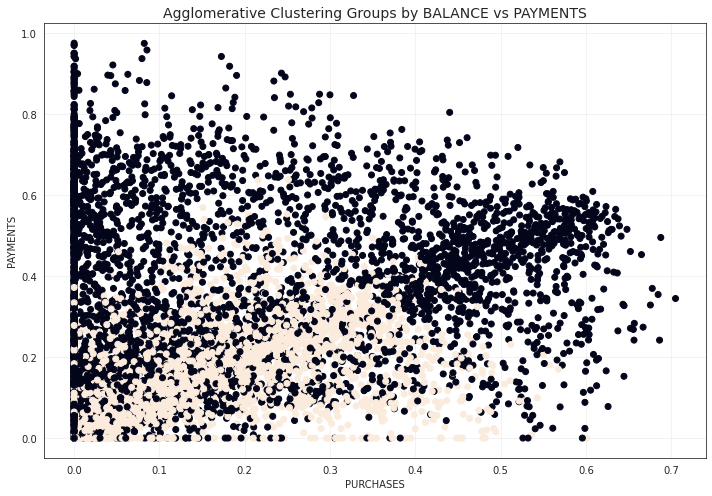

In [320]:
viz3.make_scatter('PURCHASES', 'PAYMENTS', c=cluster.labels_, xlabel = ('PURCHASES', 10), ylabel = ('PAYMENTS',10), title = ('Agglomerative Clustering Groups by BALANCE vs PAYMENTS', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CASH_ADVANCE vs PAYMENTS'}, xlabel='CASH_ADVANCE', ylabel='PAYMENTS'>)

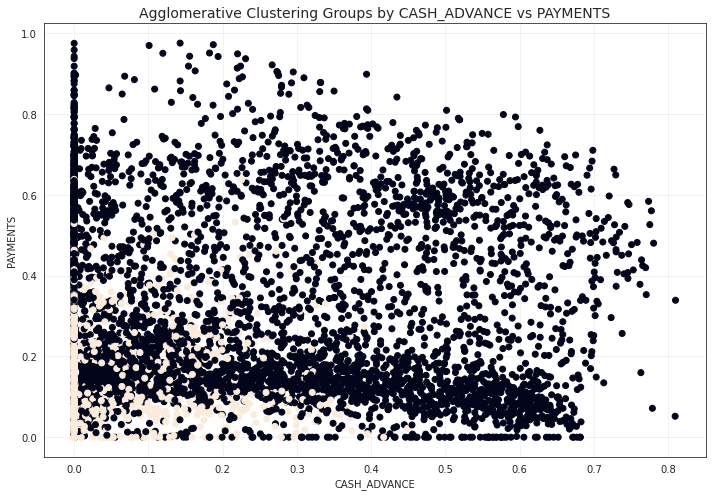

In [321]:
viz3.make_scatter('CASH_ADVANCE', 'PAYMENTS', c=cluster.labels_, xlabel = ('CASH_ADVANCE', 10), ylabel = ('PAYMENTS',10), title = ('Agglomerative Clustering Groups by CASH_ADVANCE vs PAYMENTS', 14))

#### N=2 Hierarchical Clustering Visualization - Tenure

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by TENURE vs PAYMENTS'}, xlabel='TENURE', ylabel='PAYMENTS'>)

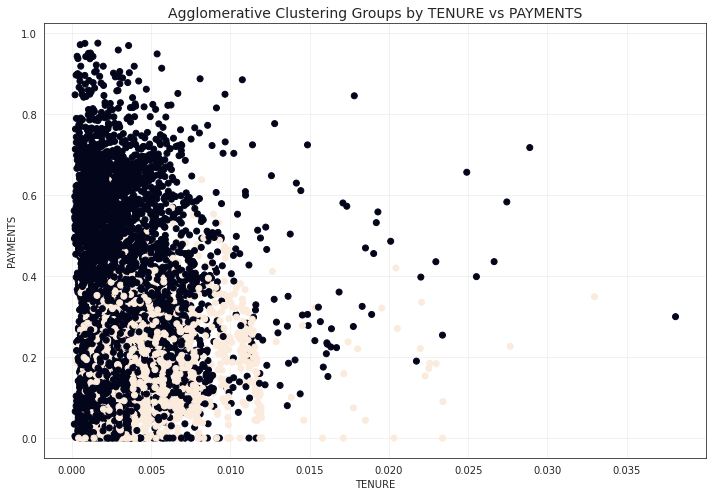

In [322]:
#this one 
viz3.make_scatter('TENURE', 'PAYMENTS', c=cluster.labels_, xlabel = ('TENURE', 10), ylabel = ('PAYMENTS',10), title = ('Agglomerative Clustering Groups by TENURE vs PAYMENTS', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by TENURE vs PURCHASES'}, xlabel='TENURE', ylabel='PURCHASES'>)

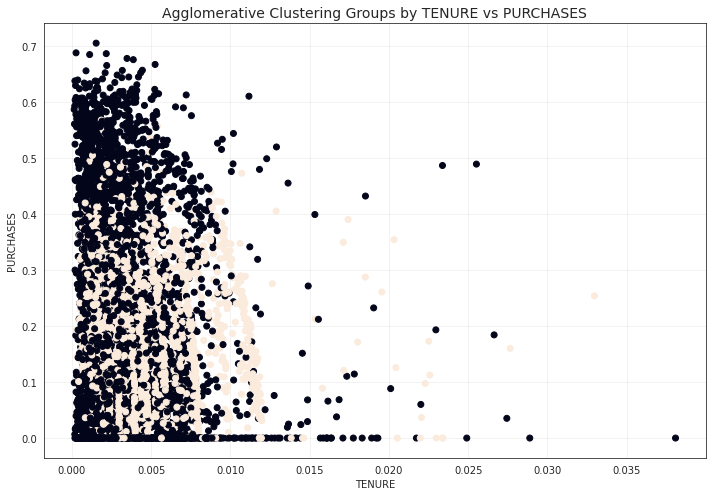

In [323]:
viz3.make_scatter('TENURE', 'PURCHASES', c=cluster.labels_, xlabel = ('TENURE', 10), ylabel = ('PURCHASES',10), title = ('Agglomerative Clustering Groups by TENURE vs PURCHASES', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by TENURE vs CASH_ADVANCE'}, xlabel='TENURE', ylabel='CASH_ADVANCE'>)

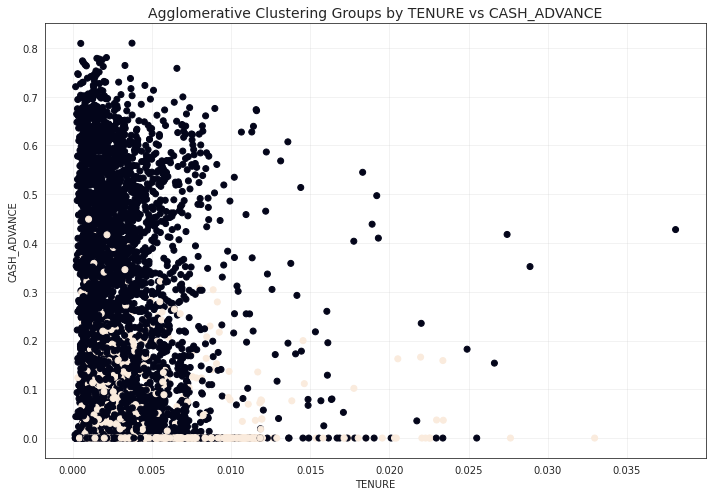

In [324]:
viz3.make_scatter('TENURE', 'CASH_ADVANCE', c=cluster.labels_, xlabel = ('TENURE', 10), ylabel = ('CASH_ADVANCE',10), title = ('Agglomerative Clustering Groups by TENURE vs CASH_ADVANCE', 14))

#### N=2 Hierarchical Clustering Visualization - Credit Limit 

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CREDIT_LIMIT vs PAYMENTS'}, xlabel='CREDIT_LIMIT', ylabel='PAYMENTS'>)

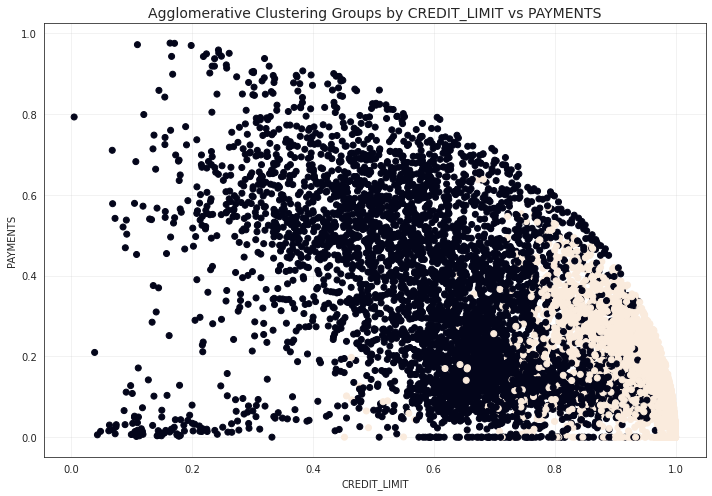

In [325]:
#this one 
viz3.make_scatter('CREDIT_LIMIT', 'PAYMENTS', c=cluster.labels_, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('PAYMENTS',10), title = ('Agglomerative Clustering Groups by CREDIT_LIMIT vs PAYMENTS', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CREDIT_LIMIT vs PURCHASES'}, xlabel='CREDIT_LIMIT', ylabel='PURCHASES'>)

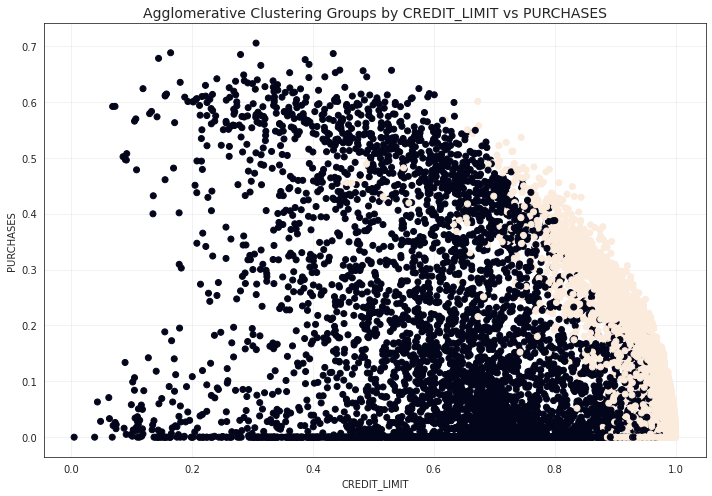

In [326]:
#this one 
viz3.make_scatter('CREDIT_LIMIT', 'PURCHASES', c=cluster.labels_, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('PURCHASES',10), title = ('Agglomerative Clustering Groups by CREDIT_LIMIT vs PURCHASES', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CREDIT_LIMIT vs CASH_ADVANCE'}, xlabel='CREDIT_LIMIT', ylabel='CASH_ADVANCE'>)

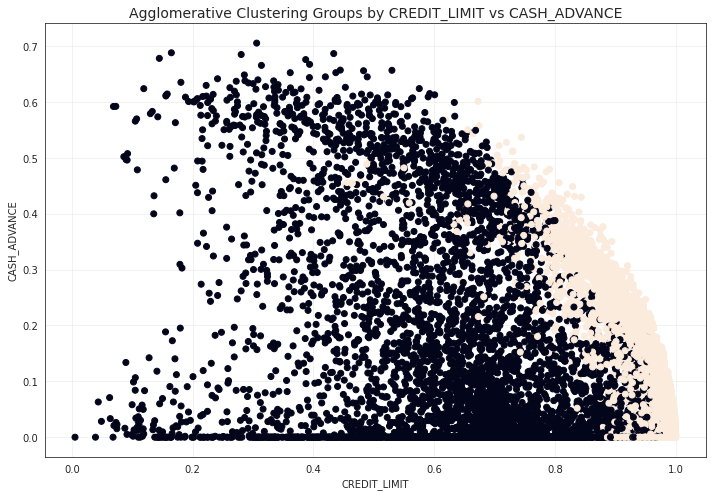

In [327]:
#this one 
viz3.make_scatter('CREDIT_LIMIT', 'PURCHASES', c=cluster.labels_, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('CASH_ADVANCE',10), title = ('Agglomerative Clustering Groups by CREDIT_LIMIT vs CASH_ADVANCE', 14))

#### N=3 Hierarchical Clustering Visualization - Tenure

In [446]:
cluster3 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')  
cluster3.fit_predict(df_scaled2)

array([1, 0, 2, ..., 1, 1, 0])

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by TENURE vs PAYMENTS'}, xlabel='TENURE', ylabel='PAYMENTS'>)

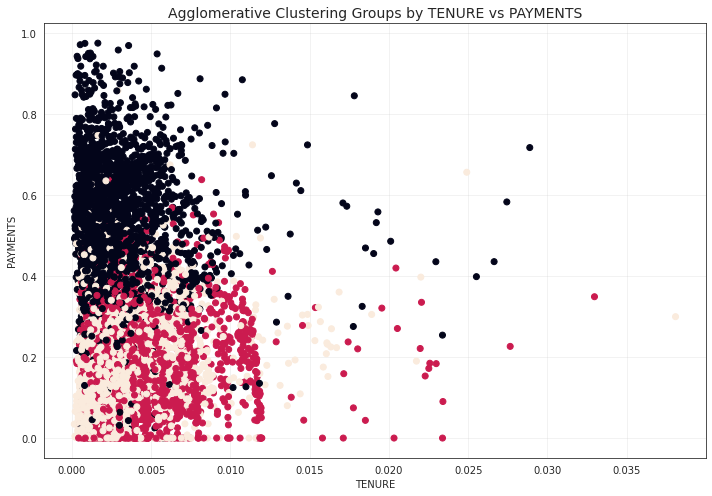

In [331]:
viz3.make_scatter('TENURE', 'PAYMENTS', c=cluster3.labels_, xlabel = ('TENURE', 10), ylabel = ('PAYMENTS',10), title = ('Agglomerative Clustering Groups by TENURE vs PAYMENTS', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by TENURE vs PURCHASES'}, xlabel='TENURE', ylabel='PURCHASES'>)

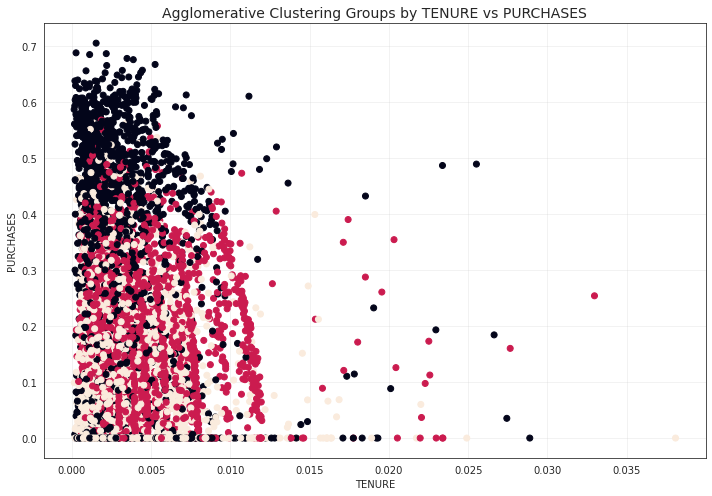

In [332]:
viz3.make_scatter('TENURE', 'PURCHASES', c=cluster3.labels_, xlabel = ('TENURE', 10), ylabel = ('PURCHASES',10), title = ('Agglomerative Clustering Groups by TENURE vs PURCHASES', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by TENURE vs CASH_ADVANCE'}, xlabel='TENURE', ylabel='CASH_ADVANCE'>)

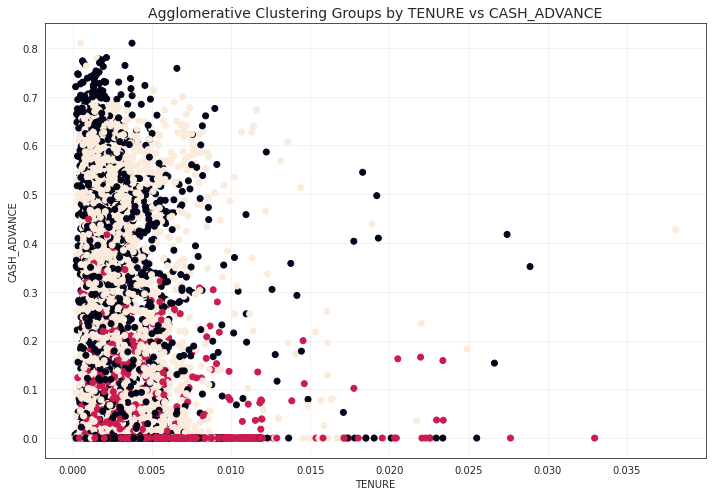

In [333]:
viz3.make_scatter('TENURE', 'CASH_ADVANCE', c=cluster3.labels_, xlabel = ('TENURE', 10), ylabel = ('CASH_ADVANCE',10), title = ('Agglomerative Clustering Groups by TENURE vs CASH_ADVANCE', 14))

#### N=3 Hierarchical Clustering Visualization - Credit Limit 

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CREDIT_LIMIT vs PAYMENTS'}, xlabel='CREDIT_LIMIT', ylabel='PAYMENTS'>)

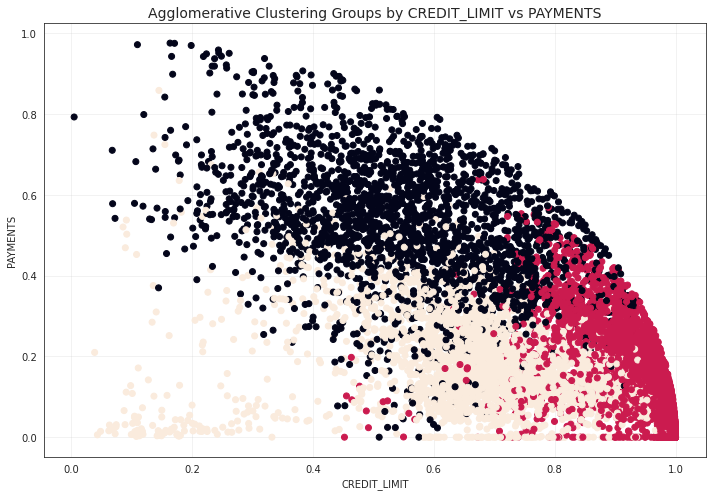

In [334]:
#this one 
viz3.make_scatter('CREDIT_LIMIT', 'PAYMENTS', c=cluster3.labels_, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('PAYMENTS',10), title = ('Agglomerative Clustering Groups by CREDIT_LIMIT vs PAYMENTS', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CREDIT_LIMIT vs PURCHASES'}, xlabel='CREDIT_LIMIT', ylabel='PURCHASES'>)

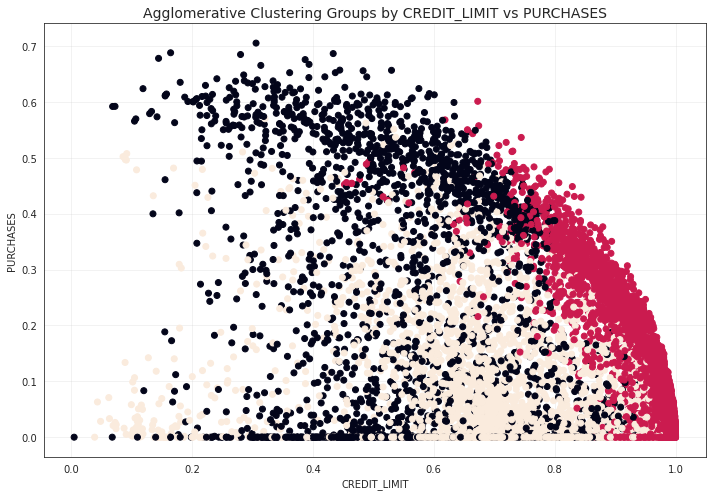

In [335]:
#this one 
viz3.make_scatter('CREDIT_LIMIT', 'PURCHASES', c=cluster3.labels_, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('PURCHASES',10), title = ('Agglomerative Clustering Groups by CREDIT_LIMIT vs PURCHASES', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CREDIT_LIMIT vs CASH_ADVANCE'}, xlabel='CREDIT_LIMIT', ylabel='CASH_ADVANCE'>)

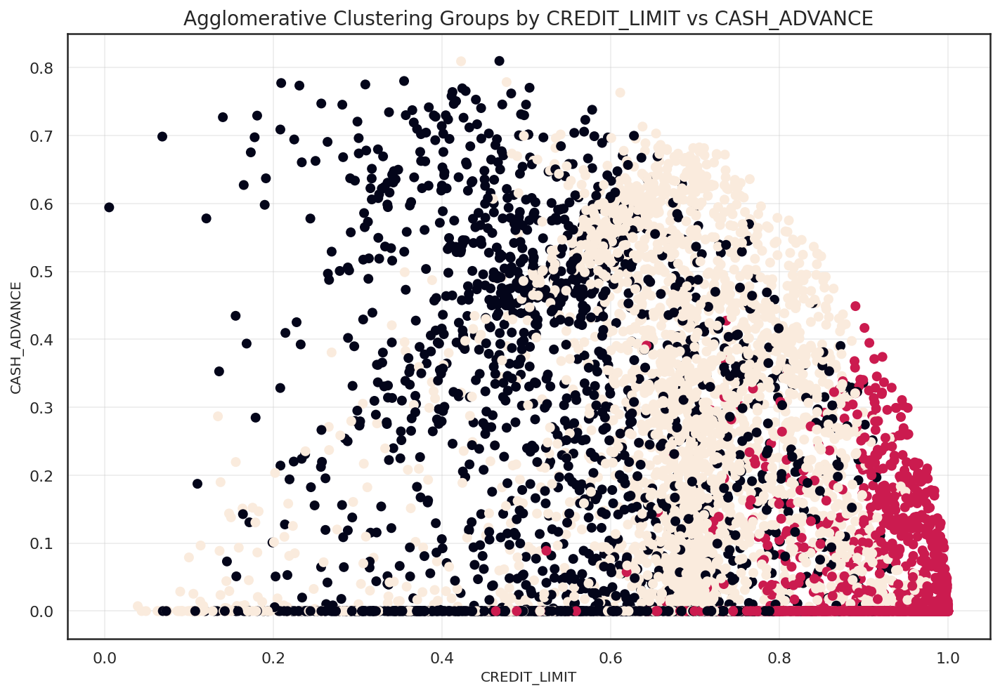

In [435]:
#this one 
viz3.make_scatter('CREDIT_LIMIT', 'CASH_ADVANCE', c=cluster3.labels_, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('CASH_ADVANCE',10), title = ('Agglomerative Clustering Groups by CREDIT_LIMIT vs CASH_ADVANCE', 14))

#### N=4 Hierarchical Clustering Visualization - Tenure

In [337]:
cluster4 = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')  
cluster4.fit_predict(df_scaled2)

array([1, 2, 0, ..., 1, 1, 3])

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by TENURE vs PAYMENTS'}, xlabel='TENURE', ylabel='PAYMENTS'>)

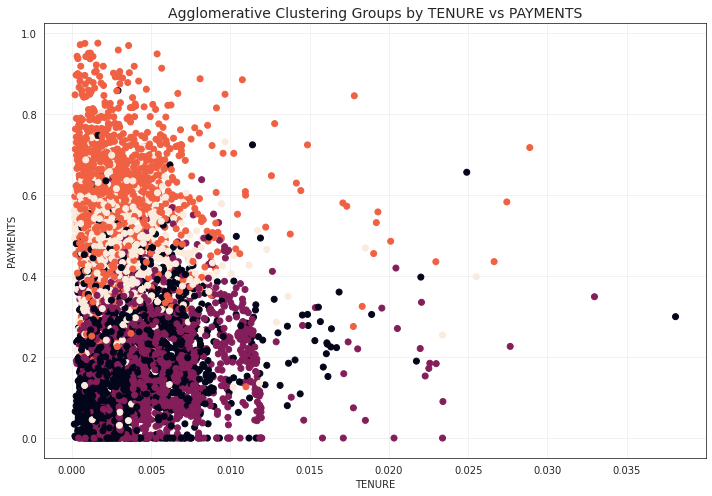

In [338]:
viz3.make_scatter('TENURE', 'PAYMENTS', c=cluster4.labels_, xlabel = ('TENURE', 10), ylabel = ('PAYMENTS',10), title = ('Agglomerative Clustering Groups by TENURE vs PAYMENTS', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by TENURE vs PURCHASES'}, xlabel='TENURE', ylabel='PURCHASES'>)

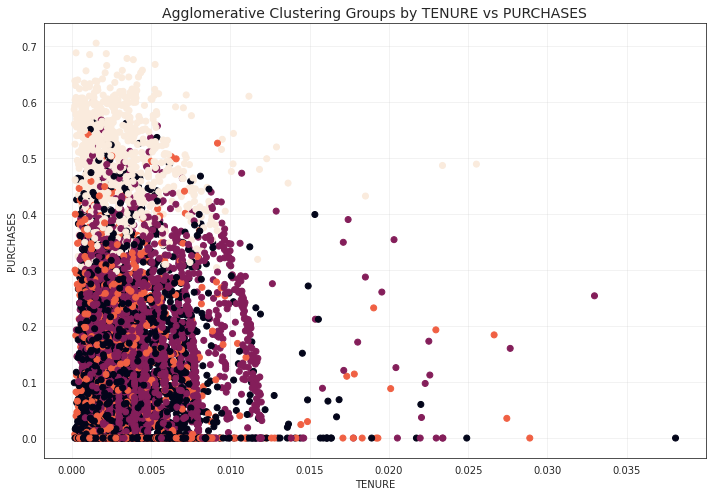

In [339]:
viz3.make_scatter('TENURE', 'PURCHASES', c=cluster4.labels_, xlabel = ('TENURE', 10), ylabel = ('PURCHASES',10), title = ('Agglomerative Clustering Groups by TENURE vs PURCHASES', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by TENURE vs CASH_ADVANCE'}, xlabel='TENURE', ylabel='CASH_ADVANCE'>)

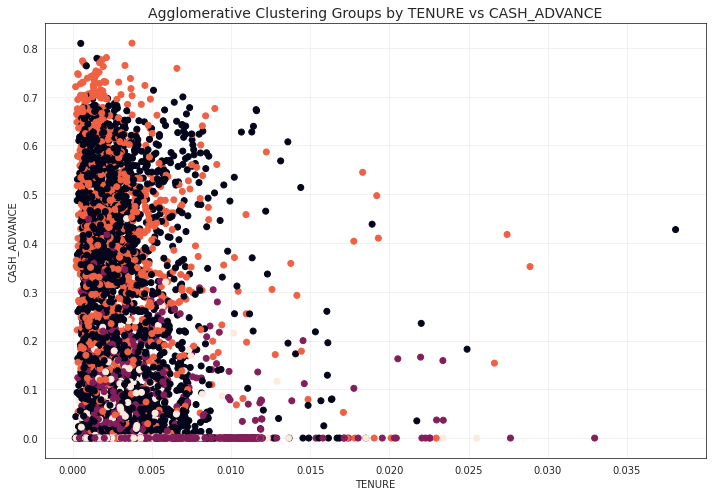

In [340]:
viz3.make_scatter('TENURE', 'CASH_ADVANCE', c=cluster4.labels_, xlabel = ('TENURE', 10), ylabel = ('CASH_ADVANCE',10), title = ('Agglomerative Clustering Groups by TENURE vs CASH_ADVANCE', 14))

#### N=4 Hierarchical Clustering Visualization - Credit Limit 

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CREDIT_LIMIT vs PAYMENTS'}, xlabel='CREDIT_LIMIT', ylabel='PAYMENTS'>)

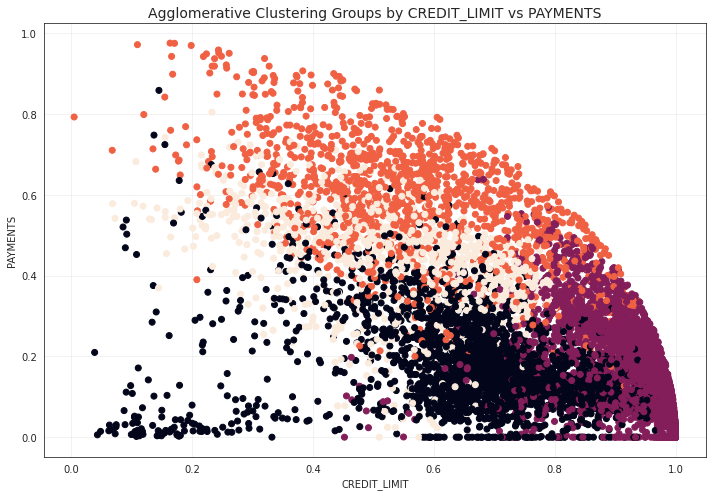

In [341]:
#this one 
viz3.make_scatter('CREDIT_LIMIT', 'PAYMENTS', c=cluster4.labels_, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('PAYMENTS',10), title = ('Agglomerative Clustering Groups by CREDIT_LIMIT vs PAYMENTS', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CREDIT_LIMIT vs PURCHASES'}, xlabel='CREDIT_LIMIT', ylabel='PURCHASES'>)

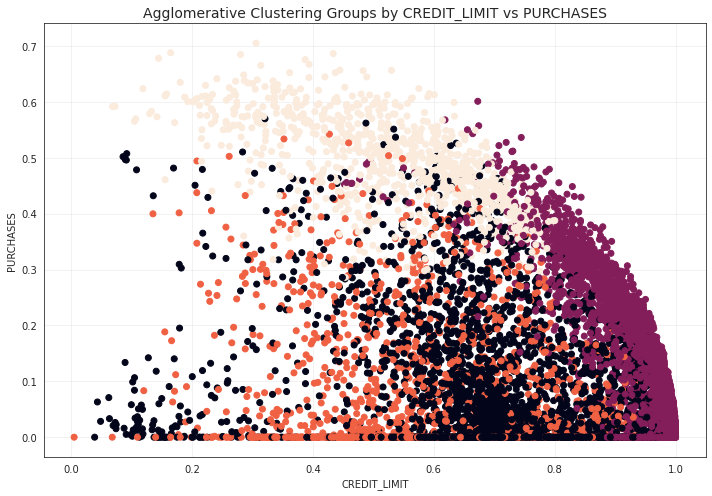

In [342]:
#this one 
viz3.make_scatter('CREDIT_LIMIT', 'PURCHASES', c=cluster4.labels_, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('PURCHASES',10), title = ('Agglomerative Clustering Groups by CREDIT_LIMIT vs PURCHASES', 14))

(<Figure size 720x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Agglomerative Clustering Groups by CREDIT_LIMIT vs CASH_ADVANCE'}, xlabel='CREDIT_LIMIT', ylabel='CASH_ADVANCE'>)

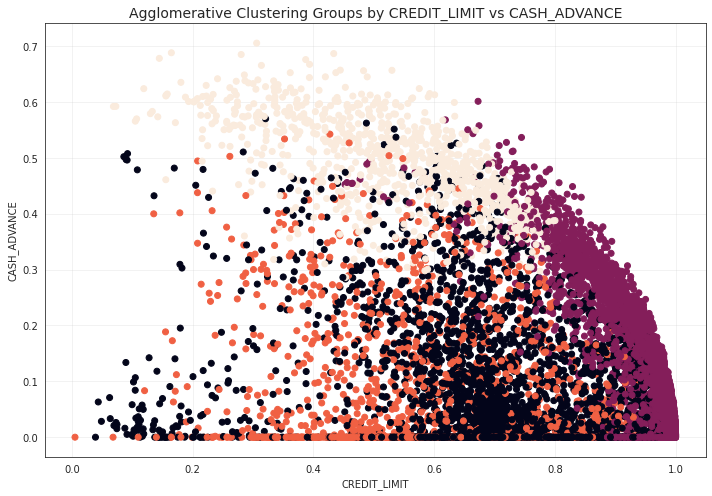

In [343]:
#this one 
viz3.make_scatter('CREDIT_LIMIT', 'PURCHASES', c=cluster4.labels_, xlabel = ('CREDIT_LIMIT', 10), ylabel = ('CASH_ADVANCE',10), title = ('Agglomerative Clustering Groups by CREDIT_LIMIT vs CASH_ADVANCE', 14))

### Silhouette Score Calculation 

#### KMeans

#Silhouette scores - 3 possible scenarios:

b is large (meaning cluster centroids are far apart; good) and a is small (meaning each cluster is tightly grouped around centroid; good) --> numerator reduces to b while 
denominator becomes b == 1 (good)


b is large (meaning cluster centroids are far apart; good) and a is large (meaning each cluster is dispersed  around centroid; bad) --> numerator reduces to 0 while 
denominator becomes a or b == 0 (indifferent)


b is small (meaning cluster centroids are close together; bad) and a is large (meaning each cluster is dispersed around centroid; bad) --> numerator reduces to -a while 
denominator becomes a == -1 (bad)


In [351]:
kmeans = KMeans(n_clusters=3, init='k-means++', n_init = 10, tol = 1e-04, random_state = 0)
get_silhouette_score(clusterer = kmeans, X = X)

Silhouette Score: 0.18107170024860117
1.5 sec to complete <function get_silhouette_score at 0x7fabd251aca0>


In [352]:
kmeans = KMeans(n_clusters=4, init='k-means++', n_init = 10, tol = 1e-04, random_state = 0)
get_silhouette_score(clusterer = kmeans, X = X)

Silhouette Score: 0.18284336892178762
1.6 sec to complete <function get_silhouette_score at 0x7fabd251aca0>


In [353]:
kmeans = KMeans(n_clusters=5, init='k-means++', n_init = 10, tol = 1e-04, random_state = 0)
get_silhouette_score(clusterer = kmeans, X = X)

Silhouette Score: 0.19499806651707807
2.0 sec to complete <function get_silhouette_score at 0x7fabd251aca0>


#### HDBSCAN Clustering Silhouette Score

In [374]:
print(f'Silhouette Score: {silhouette_score(X, cluster_labels)}')

Silhouette Score: -0.06450436018430346


#### Agglomerative Clustering Silhouette Score

In [452]:
cluster3 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')  
cluster3.fit_predict(df_scaled)
labels3 = cluster3.fit_predict(df_scaled)
print(f'Silhouette Score: {silhouette_score(X, labels3)}')

Silhouette Score: 0.15791456561681974


In [364]:
labels4 = cluster4.fit_predict(df_scaled)
print(f'Silhouette Score: {silhouette_score(X, labels4)}')

Silhouette Score: 0.16082164138890545


### 3D Visualization of Best Cluster Results

/tmp/ipykernel_52/1228195475.py:14: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.



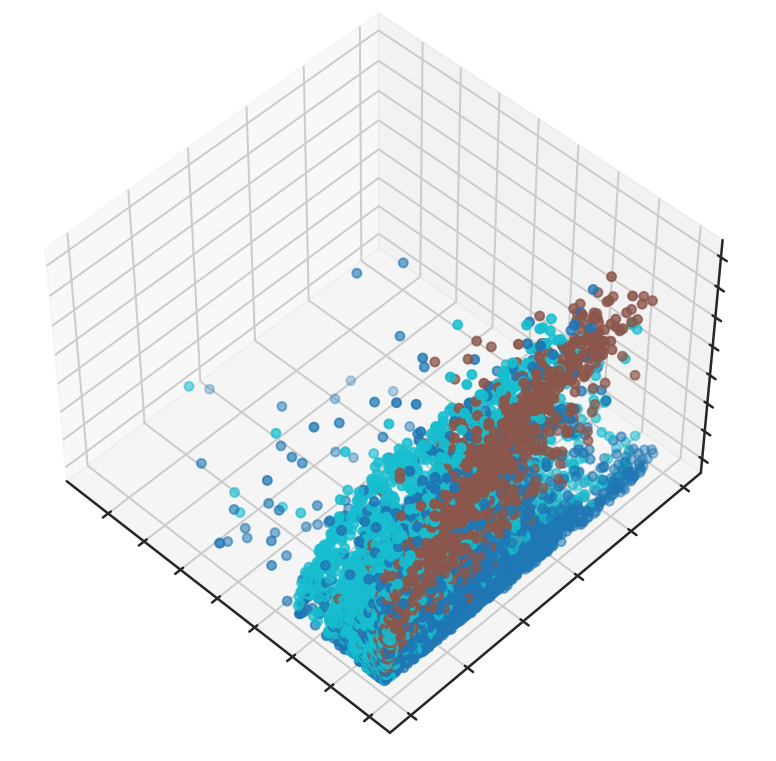

In [467]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style='white')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from sklearn import decomposition
from sklearn import datasets
from mpl_toolkits.mplot3d import Axes3D


# Let's create a beautiful 3d-plot
fig = plt.figure(1, figsize=(6, 5))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

plt.cla()

ax.scatter( xs=df_scaled2['TENURE'], 
            ys=df_scaled2['CREDIT_LIMIT'], 
            zs=df_scaled2['PURCHASES'], 
            c=labels3, 
            cmap='tab10')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([]);

In [456]:
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,ONEOFF_PURCHASES/PURCHASES,INSTALLMENTS_PURCHASES/PURCHASES,MINIMUM_PAYMENTS/PAYMENTS,Average_Purchase_Amount,Average_Cash_Advance_Amount
0,40.90,0.82,95.40,0.00,95.40,0.00,0.17,0.00,0.08,0.00,0,2,1000.00,201.80,139.51,0.00,12,0.00,1.00,0.69,47.70,0.00
1,3202.47,0.91,0.00,0.00,0.00,6442.95,0.00,0.00,0.00,0.25,4,0,7000.00,4103.03,1072.34,0.22,12,0.00,0.00,0.26,0.00,1610.74
2,2495.15,1.00,773.17,773.17,0.00,0.00,1.00,1.00,0.00,0.00,0,12,7500.00,622.07,627.28,0.00,12,1.00,0.00,1.01,64.43,0.00
3,1666.67,0.64,1499.00,1499.00,0.00,205.79,0.08,0.08,0.00,0.08,1,1,7500.00,0.00,0.00,0.00,12,1.00,0.00,0.00,1499.00,205.79
4,817.71,1.00,16.00,16.00,0.00,0.00,0.08,0.08,0.00,0.00,0,1,1200.00,678.33,244.79,0.00,12,1.00,0.00,0.36,16.00,0.00


In [471]:
# Import dependencies
import plotly
import plotly.graph_objs as go
go.Scatter3d?

<IPython.core.display.Javascript object>


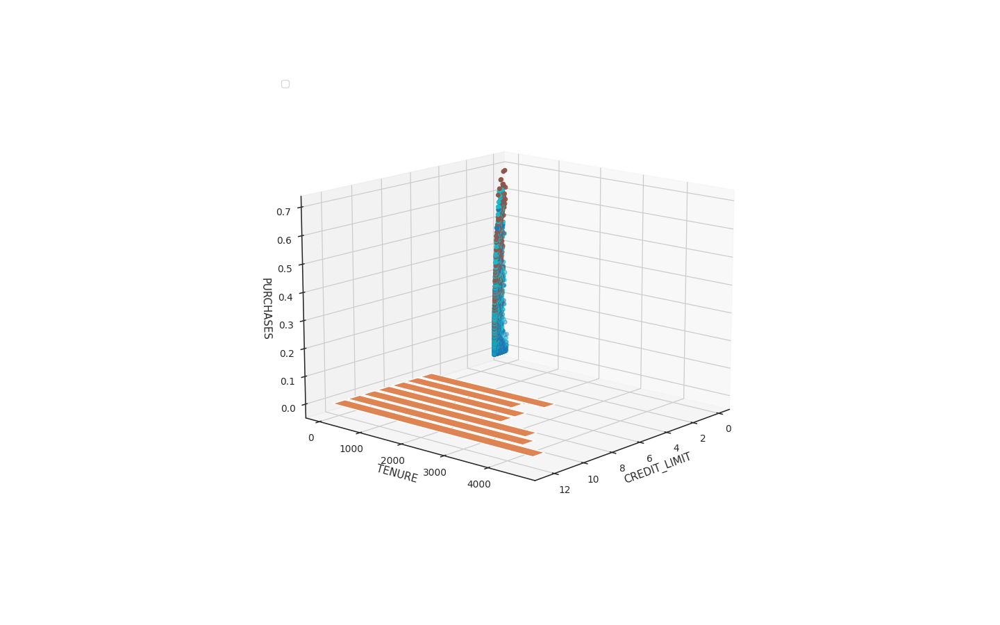

/tmp/ipykernel_52/105331727.py:2: MatplotlibDeprecationWarning:

Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().

No handles with labels found to put in legend.


In [482]:
df_scaled2_3d, labels3_3d = df_scaled2[:3000], labels3[:3000]
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_scaled2_3d['CREDIT_LIMIT'], 
    ys=df_scaled2_3d['TENURE'], 
    zs=df_scaled2_3d['PURCHASES'], 
    c=labels3_3d, 
    cmap='tab10'
)
ax.set_xlabel('CREDIT_LIMIT')
ax.set_ylabel('TENURE')
ax.set_zlabel('PURCHASES')
ax.legend(loc = 'upper left')
plt.show()

(array([  26.,   96.,  170.,  324.,  555.,  868., 1622., 1422., 1254.,
        2613.]),
 array([0.00523473, 0.10471108, 0.20418743, 0.30366379, 0.40314014,
        0.50261649, 0.60209284, 0.70156919, 0.80104554, 0.90052189,
        0.99999824]),
 <BarContainer object of 10 artists>)

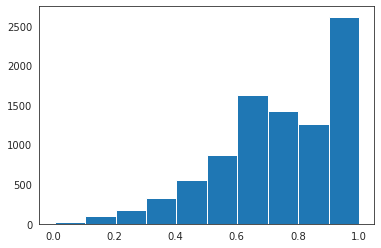

In [367]:
plt.hist(df_scaled2['CREDIT_LIMIT'])

(array([4.584e+03, 2.095e+03, 1.326e+03, 5.780e+02, 2.150e+02, 1.090e+02,
        3.300e+01, 6.000e+00, 1.000e+00, 3.000e+00]),
 array([   50.,  3045.,  6040.,  9035., 12030., 15025., 18020., 21015.,
        24010., 27005., 30000.]),
 <BarContainer object of 10 artists>)

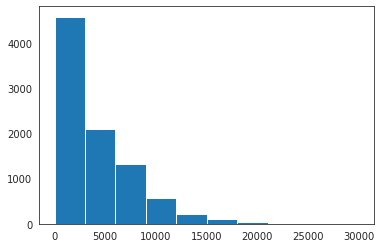

In [369]:
plt.hist(df['CREDIT_LIMIT'])

In [ ]:
print(df.loc[df['MINIMUM_PAYMENTS'] > df['PAYMENTS']].shape[0])
print(df.loc[df['INSTALLMENTS_PURCHASES'] > df['PURCHASES']].shape[0])
print(df.loc[df['ONEOFF_PURCHASES'] > df['PURCHASES']].shape[0])